# 02 - Exploratory Data Analysis and Modeling

___

### 02.1 - Importando as bibliotecas

In [1]:
# Bibliotecas básicas
import os
import numpy as np
import pandas as pd
from datetime import datetime  
from datetime import timedelta

# Bibliotecas para visualização de dados
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Bibliotecas para trabalhar com Séries Temporais
from statsmodels.tsa.stattools import pacf, acf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA

# Bibliotecas de Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import lightgbm as lgb

# Deep Learning
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

# Prophet (Facebook)
from fbprophet import Prophet

# Métrica de avaliação
from sklearn.metrics import mean_squared_error

# Configurando a largura das células do notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Configurando o tamanho dos plots do matplotlib
import matplotlib
matplotlib.rcParams['figure.figsize'] = [21, 6]

# Silenciando os warnings
import warnings
warnings.filterwarnings('ignore')

### 02.2 - Definindo os caminhos

In [2]:
THIS_PATH = os.getcwd()
ROOT_PATH = os.path.dirname(THIS_PATH)
DATA_PATH = os.path.join(ROOT_PATH, 'data')

### 02.3 - Carregando os dados

In [3]:
stocks_file = os.path.join(DATA_PATH, 'stocks.csv')
stocks_df = pd.read_csv(stocks_file)

In [4]:
stocks_df.head(2)

,Date,High,Low,Open,Close,Volume,Adj Close,Ticker
0,2005-01-03,4.58232,4.58232,4.58232,4.58232,40041.0,0.825290,ABEV3
1,2005-01-04,4.61528,4.61528,4.61528,4.61528,72498.0,0.831226,ABEV3


Nesta análise exploratória, antes de tudo, vamos avaliar se existem padrões que podem ser previstos nos preços das ações. Portanto, a princípio, para facilitar, limitaremos a quantidade de papéis a serem analisados. Se concluirmos que há padrões significativos, podemos extrapolar as análises para as demais empresas. Sendo assim, por motivo de gosto particular, escolhi analisar as empresas do setor financeiro, isto é, bancos.

In [5]:
setor_file = os.path.join(DATA_PATH, 'setores.csv')
setor_df = pd.read_csv(setor_file)
setor_df.drop('Unnamed: 0', axis=1, inplace=True)

In [6]:
setor_df.head(2)

,Ticker,Setor,Subsetor
0,ABEV3,Bebidas,Cervejas e Refrigerantes
1,AZUL4,Transporte,Transporte Aéreo


### 02.4 - Filtrando os dados

In [7]:
tickers_bancos = setor_df[setor_df['Subsetor'] == 'Bancos']['Ticker'].to_list()

In [8]:
# Vamos filtrar a tabela de stocks para conter apenas bancos
df_bancos = stocks_df[stocks_df['Ticker'].isin(tickers_bancos)].reset_index(drop=True)

In [9]:
df_bancos[df_bancos['Ticker'] == 'BBAS3'].tail(10)

,Date,High,Low,Open,Close,Volume,Adj Close,Ticker
3854,2020-07-28,35.779999,34.549999,34.700001,35.029999,17055500.0,35.029999,BBAS3
3855,2020-07-29,35.950001,35.150002,35.380001,35.950001,13101300.0,35.950001,BBAS3
3856,2020-07-30,35.540001,34.520000,35.119999,34.799999,23154800.0,34.799999,BBAS3
3857,2020-07-31,34.970001,33.570000,34.900002,33.580002,20701300.0,33.580002,BBAS3
3858,2020-08-03,35.040001,33.779999,34.240002,34.349998,24030700.0,34.349998,BBAS3
3859,2020-08-04,34.599998,33.009998,33.880001,33.299999,20774400.0,33.299999,BBAS3
3860,2020-08-05,33.970001,32.900002,33.810001,33.330002,14184600.0,33.330002,BBAS3
3861,2020-08-06,34.430000,33.139999,33.759998,34.349998,18267300.0,34.349998,BBAS3
3862,2020-08-07,34.939999,33.599998,34.000000,34.110001,18561800.0,34.110001,BBAS3
3863,2020-08-10,34.599998,33.750000,34.119999,34.430000,9726000.0,34.430000,BBAS3


In [10]:
df_bancos['Ticker'].unique()

array(['BBAS3', 'BBDC3', 'BBDC4', 'BPAC11', 'ITSA4', 'ITUB4', 'SANB11'],
      dtype=object)

### 02.5 - Arrumando os dados

O dado temporal que iremos analisar será o valor ajustado de fechamento das ações, ou seja, a coluna 'Adj Close'. Portanto, vamos arrumar o layout do DataFrame para que possamos comparar as empresas.

In [11]:
# Apagando as colunas que não utilizaremos nesta análise
cols_drop = ['High', 'Low', 'Open', 'Close', 'Volume']
df_bancos.drop(cols_drop, axis=1, inplace=True)

In [12]:
df_bancos.tail(2)

,Date,Adj Close,Ticker
22013,2020-08-07,29.25,SANB11
22014,2020-08-10,30.34,SANB11


In [13]:
# Colocando as empresas lado a lado
tickers = df_bancos['Ticker'].unique().tolist()

In [14]:
tickers

['BBAS3', 'BBDC3', 'BBDC4', 'BPAC11', 'ITSA4', 'ITUB4', 'SANB11']

In [15]:
df_bancos_fixed = pd.DataFrame()

for t in tickers:
    aux = df_bancos[df_bancos['Ticker'] == t].reset_index(drop=True)
    aux.rename(columns={'Adj Close': t}, inplace=True)
    aux.drop('Ticker', axis=1, inplace=True)
    
    if len(df_bancos_fixed) == 0:
        df_bancos_fixed = aux
    else:
        df_bancos_fixed = df_bancos_fixed.merge(aux, how='outer', on='Date').sort_values(by='Date')

In [16]:
df_bancos_fixed.tail(3)

,Date,BBAS3,BBDC3,BBDC4,BPAC11,ITSA4,ITUB4,SANB11
3875,2020-08-06,34.349998,20.420000,21.969999,89.639999,10.32,26.030001,29.593403
3876,2020-08-07,34.110001,20.290001,21.840000,88.139999,10.21,25.480000,29.250000
3877,2020-08-10,34.430000,20.459999,22.030001,88.459999,10.36,25.809999,30.340000


In [17]:
# Removendo papéis de empresas iguais
cols_drop = ['BBDC3', 'ITSA4']
df_bancos_fixed.drop(cols_drop, axis=1, inplace=True)

In [18]:
df_bancos_fixed.tail(3)

,Date,BBAS3,BBDC4,BPAC11,ITUB4,SANB11
3875,2020-08-06,34.349998,21.969999,89.639999,26.030001,29.593403
3876,2020-08-07,34.110001,21.840000,88.139999,25.480000,29.250000
3877,2020-08-10,34.430000,22.030001,88.459999,25.809999,30.340000


In [19]:
# As ações da empresa 'BPAC11' tem um histórico relativamente pequeno (a partir de 2017)
df_bancos_fixed[~df_bancos_fixed['BPAC11'].isnull()][['Date']].min()

Date    2017-02-24
dtype: object

In [20]:
# Por isso, vamos removê-la também
df_bancos_fixed.drop('BPAC11', axis=1, inplace=True)

In [21]:
df_bancos_fixed.tail(2)

,Date,BBAS3,BBDC4,ITUB4,SANB11
3876,2020-08-07,34.110001,21.840000,25.480000,29.25
3877,2020-08-10,34.430000,22.030001,25.809999,30.34


In [22]:
# Salvando a base tratada
df_bancos_fixed_filename = 'exploratory-data.csv'
df_bancos_fixed.to_csv(os.path.join(DATA_PATH, df_bancos_fixed_filename), index=False)

### 02.5 - Explorando os dados

In [23]:
# Carregando a base tratada
df_bancos_fixed_filename = 'exploratory-data.csv'
exp_data = pd.read_csv(os.path.join(DATA_PATH, df_bancos_fixed_filename))

In [24]:
exp_data.tail(2)

,Date,BBAS3,BBDC4,ITUB4,SANB11
3876,2020-08-07,34.110001,21.840000,25.480000,29.25
3877,2020-08-10,34.430000,22.030001,25.809999,30.34


In [25]:
# Setando Date como o index
exp_data.set_index('Date', inplace=True)

In [26]:
exp_data.tail(2)

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2020-08-07,34.110001,21.840000,25.480000,29.25
2020-08-10,34.430000,22.030001,25.809999,30.34


In [27]:
tickers = exp_data.columns.to_list()

In [28]:
tickers

['BBAS3', 'BBDC4', 'ITUB4', 'SANB11']

#### Cotação x Tempo

In [29]:
fig = go.Figure()

for t in tickers:
    fig.add_trace(go.Scatter(x=exp_data.index, y=exp_data[t], mode='lines', name=t))

fig.update_layout(
    title={
        'text': 'Cotação x Tempo',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Tempo',
    yaxis_title='Cotação (R$)',
    legend_title='Ticker',
    font=dict(
        family='Courier New, monospace',
        size=18,
        color='Black'
    ),
#     template='plotly_white'
)
fig.show()

#### Pairplot

In [248]:
fig = px.scatter_matrix(exp_data, dimensions=tickers)

fig.update_layout(
    title={
        'text': 'Análise de Correlação',
        'y':0.97,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    font=dict(
        family='Courier New, monospace',
        size=15,
        color='Black'
    ),
#     template='plotly_white',
    width=1050,
    height=600
)

# fig.update_xaxes(xaxis={'showgrid': False})
# fig.update_yaxes(yaxis={'showgrid': False})

fig.show()

#### Correlação de Pearson

In [31]:
corr = exp_data.corr()
X = tickers
heat = go.Heatmap(
    z=corr,
    x=X,
    y=X,
    xgap=1, ygap=1,
    colorscale=[[0.0, '#3f7f93']],
    colorbar_thickness=20,
    colorbar_ticklen=5,
#     hovertext =hovertext,
    hoverinfo='text'
)

layout = go.Layout(
    title_text='Matriz de Correlação de Pearson',
    title_x=0.5, 
    width=800, height=600,
    yaxis_autorange='reversed',
#     template='plotly_dark',
    font=dict(
        family='Courier New, monospace',
        size=15,
        color='Black'
    ),
    coloraxis_colorbar=(dict(
        dtick=0.1
    )))

fig=go.Figure(data=heat, layout=layout)        
fig.show()

#### Candlesticks

In [32]:
stocks_df.tail(2)

,Date,High,Low,Open,Close,Volume,Adj Close,Ticker
225819,2020-08-07,33.180000,31.809999,32.970001,32.180000,3020900.0,32.180000,YDUQ3
225820,2020-08-10,32.459999,31.350000,32.349998,32.029999,3154200.0,32.029999,YDUQ3


In [33]:
def candlestick(ticker):
    aux = stocks_df[stocks_df['Ticker'] == ticker]
    
    fig = go.Figure(data=[go.Candlestick(x=aux['Date'],
                    open=aux['Open'],
                    high=aux['High'],
                    low=aux['Low'],
                    close=aux['Close'])])
    
    fig.update_layout(
        title={
            'text': 'Candlestick do {}'.format(ticker),
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        },
        font=dict(
            family='Courier New, monospace',
            size=18,
            color='Black'
        ),
    #     template='plotly_dark'
    )
    
    fig.show()

In [34]:
candlestick('SANB11')

#### Estatísticas de posição

In [35]:
fig = go.Figure()

for t in tickers:
    fig.add_trace(go.Violin(y=exp_data[t],
                            name=t,
                            box_visible=True,
                            meanline_visible=True))
    
    fig.update_layout(
        title={
            'text': f'Distribuições das cotações históricas',
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        },
        font=dict(
            family='Courier New, monospace',
            size=18,
            color='Black'
        )
    )
        
fig.show()

#### Distribuições

In [36]:
def plot_hist(data, ticker):
    fig = px.histogram(data, x=ticker, marginal='violin', # can be `box`, `violin`
                       hover_data=exp_data.columns)
    fig.update_traces(opacity=0.6)
    fig.update_layout(
        title={
            'text': f'\nDistribuição das cotações históricas de {ticker}',
            'y':1.0,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'
        },
        font=dict(
            family='Courier New, monospace',
            size=18,
            color='Black'
        ),
        xaxis_title_text='Cotação (R$)',
        yaxis_title_text='Quantidade',
    #     bargap=0.2, # gap between bars of adjacent location coordinates
    #     bargroupgap=0.1 # gap between bars of the same location coordinates
    )
    print('\n')
    fig.show()

In [37]:
plot_hist(exp_data, 'SANB11')

### 02.6 - Tratando os dados

#### Definindo o período

In [38]:
per = pd.DataFrame()
ini = []
fim = []

for c in exp_data.columns:
#     print(c, 'Data inicial: ', exp_data[~exp_data[c].isnull()].index.min(), '// Data final:', exp_data[~exp_data[c].isnull()].index.max())
    ini.append(exp_data[~exp_data[c].isnull()].index.min())
    fim.append(exp_data[~exp_data[c].isnull()].index.max())
    
per['Ticker'] = exp_data.columns
per['Dt_Ini'] = ini
per['Dt_Fim'] = fim

In [39]:
per

,Ticker,Dt_Ini,Dt_Fim
0,BBAS3,2005-01-03,2020-08-10
1,BBDC4,2008-01-02,2020-08-10
2,ITUB4,2005-01-03,2020-08-10
3,SANB11,2009-10-07,2020-08-10


BBAS3 e ITUB4 possuem valores desde 2005. BBDC4, a partir de 2008. E SANB11, a partir do final de 2009. Portanto, vamos considerar de 2010 para frente. Assim, teremos um bom período para analisar e não consideramos dados muitos antigos, que tendem a ter pouca influência sobre os dados mais recentes.

In [40]:
exp_data.shape

(3878, 4)

In [41]:
# Removendo os dados anteriores a 2010
exp_data.drop(exp_data[exp_data.index < '2010-01-01'].index, axis=0, inplace=True)

In [42]:
exp_data.head(2)

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2010-01-04,16.643383,9.713889,12.350099,14.976392
2010-01-05,16.476391,9.671092,12.430142,15.121425


In [43]:
exp_data.shape

(2629, 4)

#### Tratamento de missings

In [44]:
exp_data.isnull().sum() / len(exp_data) * 100

BBAS3     0.494485
BBDC4     1.255230
ITUB4     0.456447
SANB11    0.418410
dtype: float64

Nota-se que não existem muitos valores missing. Neste caso, como podemos observar comportamento de tendência nas séries temporais, vamos utilizar o método de interpolação linear.

In [45]:
exp_data[exp_data['ITUB4'].isnull()]

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2010-05-28,14.856873,11.082592,NaN,11.905439
2011-10-25,NaN,NaN,NaN,NaN
2011-10-26,NaN,NaN,NaN,NaN
2011-10-27,NaN,NaN,NaN,NaN
2011-11-10,NaN,NaN,NaN,NaN
2011-12-12,NaN,NaN,NaN,NaN
2012-01-17,NaN,NaN,NaN,NaN
2012-02-13,15.877047,8.670382,NaN,11.674769
2012-03-19,17.388380,9.088017,NaN,12.589262


In [46]:
exp_data.loc['2011-11-05':'2011-11-15']

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2011-11-07,15.251719,8.524333,10.300629,9.914286
2011-11-08,15.209821,8.579308,10.284811,9.907701
2011-11-09,14.796803,8.441819,10.025695,9.683873
2011-11-10,NaN,NaN,NaN,NaN
2011-11-11,14.647154,8.400558,10.060467,9.789206
2011-11-14,15.143975,8.524333,10.085726,9.677289


In [47]:
exp_data.interpolate(method='linear').loc['2011-11-10']

BBAS3     14.721978
BBDC4      8.421189
ITUB4     10.043081
SANB11     9.736539
Name: 2011-11-10, dtype: float64

In [48]:
exp_data.interpolate(method='linear', axis=0, inplace=True)

In [49]:
exp_data.isnull().sum()

BBAS3     0
BBDC4     0
ITUB4     0
SANB11    0
dtype: int64

#### Autocorrelação

In [50]:
exp_data.head(2)

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2010-01-04,16.643383,9.713889,12.350099,14.976392
2010-01-05,16.476391,9.671092,12.430142,15.121425


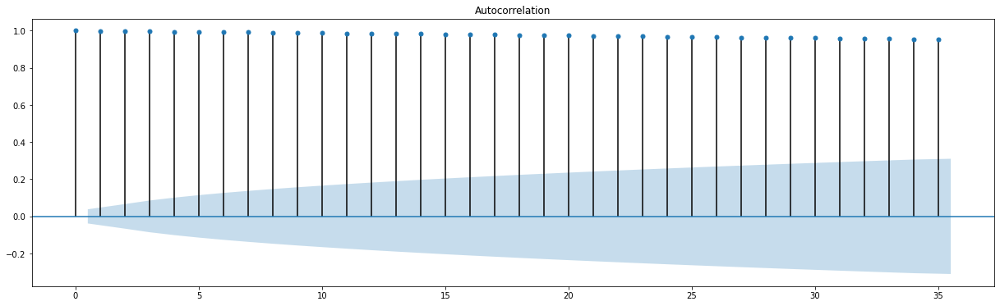

In [51]:
# autocorr = exp_data
ax = plot_acf(exp_data['ITUB4'], alpha = 0.05); # não pode ter nulos

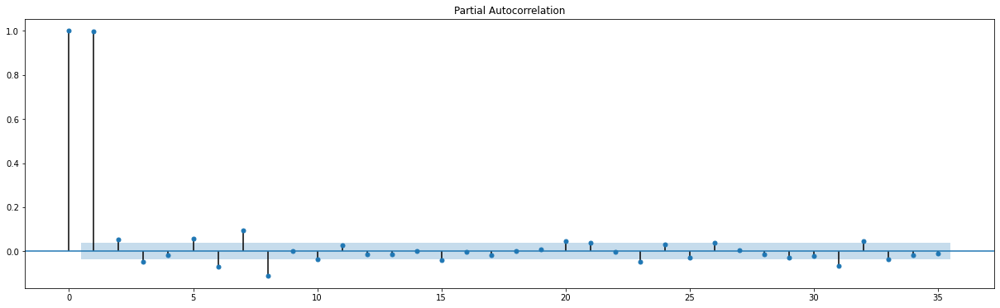

In [52]:
# autocorr = exp_data
ax = plot_pacf(exp_data['BBAS3'], alpha = 0.05); # não pode ter nulos

#### Autocorrelação na série estacionária

In [53]:
# série não estacionária
exp_data['ITUB4'].tail().to_frame()

,ITUB4
Date,
2020-08-04,25.690001
2020-08-05,25.670000
2020-08-06,26.030001
2020-08-07,25.480000
2020-08-10,25.809999


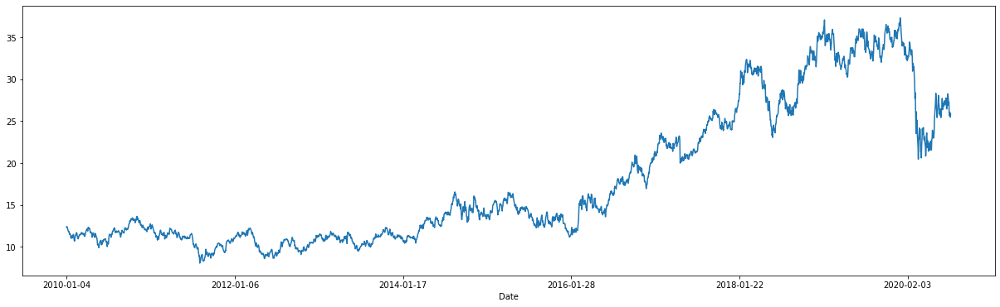

In [54]:
exp_data['ITUB4'].plot();

In [55]:
# série estacionária
exp_data_estac = exp_data.copy()
exp_data_estac['ITUB4_DIFF'] = exp_data_estac['ITUB4'].pct_change()

In [56]:
exp_data_estac[['ITUB4', 'ITUB4_DIFF']].tail()

,ITUB4,ITUB4_DIFF
Date,,
2020-08-04,25.690001,-0.058284
2020-08-05,25.670000,-0.000779
2020-08-06,26.030001,0.014024
2020-08-07,25.480000,-0.021130
2020-08-10,25.809999,0.012951


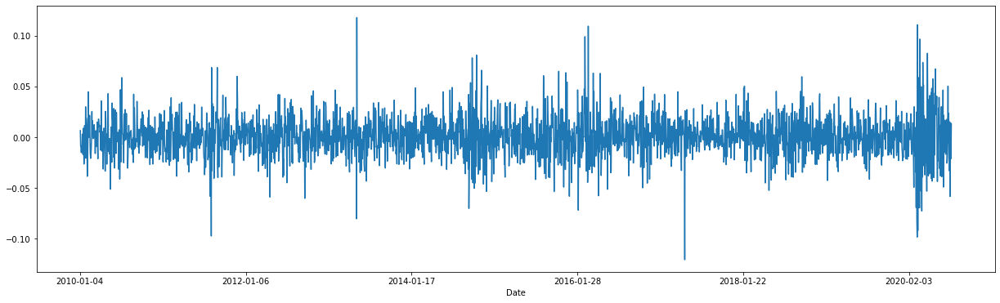

In [57]:
exp_data_estac['ITUB4_DIFF'].plot();

In [58]:
# Teste de Dickey-Fuller
adfuller_itub = adfuller(exp_data_estac['ITUB4_DIFF'].dropna())
print(np.round(adfuller_itub[1],3))

0.0


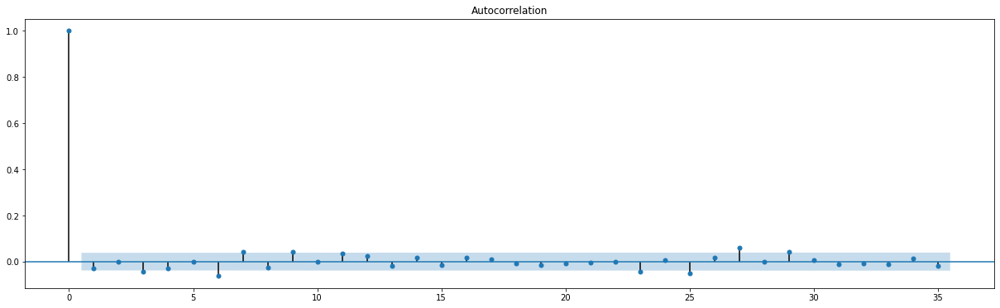

In [59]:
# Analisando a autocorrelação na série estacionária
ax = plot_acf(exp_data_estac['ITUB4_DIFF'].dropna(), alpha = 0.05); # não pode ter nulos

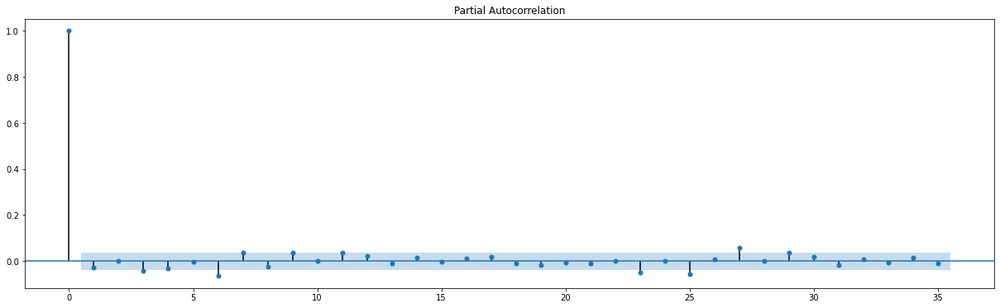

In [60]:
# Analisando a autocorrelação na série estacionária
ax = plot_pacf(exp_data_estac['ITUB4_DIFF'].dropna(), alpha = 0.05); # não pode ter nulos

Notamos que a autocorrelação na série estacionária é praticamente igual a zero, o que indica que a série (pelo menos na visão diária) é imprevisível, o que classificamos como White Noise (ou Ruído Branco).

### 02.7 Modelagem básica

Vamos testar algums abordagens de séries temporais mais básicas e compará-las com uma baseline. Nesta etapa, vamos abordar as previsões com os seguintes métodos:

- Baseline
- ARIMA
- Regressão Linear
- Random Forest

Estas abordagens serão aplicadas em 3 diferentes agrupamentos das séries temporais:

- Diário
- Semanal
- Mensal

In [61]:
# Primeiro, vamos criar as bases de séries temporais com agrupamentos distintos, conforme listado acima
exp_data.head()

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2010-01-04,16.643383,9.713889,12.350099,14.976392
2010-01-05,16.476391,9.671092,12.430142,15.121425
2010-01-06,16.498657,9.593685,12.322451,15.045755
2010-01-07,16.504221,9.567914,12.196230,14.938558
2010-01-08,16.598850,9.557588,12.011538,14.787215


In [62]:
exp_data.index = pd.to_datetime(exp_data.index)

#### Criando as bases

In [63]:
def cria_bases(df):
    # Criando os DataFrames
    diario = pd.DataFrame()
    semanal = pd.DataFrame()
    mensal = pd.DataFrame()
    
    for c in df.columns:
        diario[c] = df[c]
        semanal[c] = diario[c].resample(rule='W').last()
        mensal[c] = diario[c].resample(rule='1M').last()
#     trimestral = diario.resample(rule='3M').last()
#     semestral = diario.resample(rule='6M').last()
    
    return diario, semanal, mensal

In [64]:
diario, semanal, mensal = cria_bases(exp_data)

In [65]:
semanal.head(2)

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2010-01-10,16.598850,9.557588,12.011538,14.787215
2010-01-17,16.281569,9.304871,11.472793,14.440392


#### Transformando a série em estacionária

In [66]:
def transforma_estacionaria(df):
    new_df = df.copy()
    
    for c in df.columns:
        new_column = f'{c}_PCT'
        new_df[new_column] = new_df[c].pct_change()
    
    new_df.drop(df.columns, axis=1, inplace=True)
    new_df.dropna(inplace=True)
    
    return new_df

In [67]:
diario_pct = transforma_estacionaria(diario)

In [68]:
diario_pct.tail()

,BBAS3_PCT,BBDC4_PCT,ITUB4_PCT,SANB11_PCT
Date,,,,
2020-08-04,-0.030568,-0.020785,-0.058284,-0.028003
2020-08-05,0.000901,0.004604,-0.000779,0.003124
2020-08-06,0.030603,0.006874,0.014024,0.031142
2020-08-07,-0.006987,-0.005917,-0.021130,-0.011604
2020-08-10,0.009381,0.008700,0.012951,0.037265


In [69]:
semanal_pct = transforma_estacionaria(semanal)

In [70]:
semanal_pct.head()

,BBAS3_PCT,BBDC4_PCT,ITUB4_PCT,SANB11_PCT
Date,,,,
2010-01-17,-0.019115,-0.026442,-0.044852,-0.023454
2010-01-24,-0.024273,-0.119180,-0.027364,-0.052402
2010-01-31,-0.015417,-0.014157,-0.003314,0.037788
2010-02-07,-0.007117,-0.039838,-0.036811,-0.100800
2010-02-14,0.093190,0.051914,0.065518,0.081975


In [71]:
mensal_pct = transforma_estacionaria(mensal)

#### Separando em treino e teste

In [72]:
def split_train_valid(df, data_corte):
    train = df[df.index < data_corte]
    valid = df[df.index >= data_corte]
    return train, valid

In [73]:
train_diario, valid_diario = split_train_valid(diario, '2016-01-01')

In [74]:
train_diario.tail()

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2015-12-22,12.331509,8.788016,12.842433,12.005438
2015-12-23,12.208194,8.856509,12.794160,12.315256
2015-12-28,12.315067,8.943220,12.745887,12.539874
2015-12-29,12.167088,8.988853,12.755524,12.446928
2015-12-30,12.117763,8.801730,12.712112,12.423692


In [75]:
valid_diario.head()

,BBAS3,BBDC4,ITUB4,SANB11
Date,,,,
2016-01-04,11.706713,8.673877,12.144142,11.941384
2016-01-05,11.747819,8.711943,12.245646,11.762061
2016-01-06,11.747819,8.588534,12.197328,11.493074
2016-01-07,11.468301,8.414738,11.965375,11.175181
2016-01-08,11.468301,8.250106,11.970156,11.175181


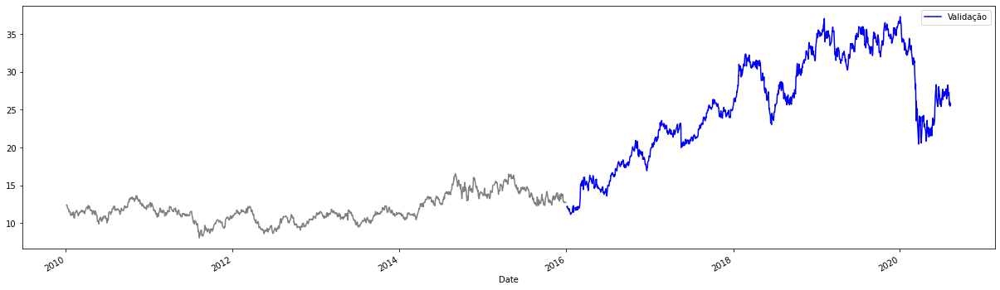

In [76]:
# Representação da separação em treino e validação
train_diario['ITUB4'].plot(color='gray', label='')
valid_diario['ITUB4'].plot(color='blue', label='Validação')
plt.legend()
plt.show();

#### Definição da métrica de avaliação

Iremos avaliar nossos modelos por meio da métrica RMSE.

In [77]:
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

In [78]:
metrica = rmse

#### Modelagem - Baseline

Vamos criar uma baseline bem simples, que será a média móvel dos retornos nos três dias anteriores. Essa baseline será importante para compararmos com os modelos mais sofisticados e verificarmos se eles conseguirão superá-la.

In [79]:
def roda_baseline(df, metrica):
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    # Separa em treino e validação
    train, valid = split_train_valid(df, '2016-01-01')
    
    # Itera entre os tickers, faz as previsões e armazena os resultados
    for c in valid.columns:
        y_true = diario_pct[c].iloc[3:]
        y_pred = diario_pct[c].rolling(3).mean().shift(1).dropna()
        dict_results[f'baseline_{c}'] = metrica(y_true, y_pred)
    
    return dict_results

#### Modelagem - ARIMA

In [80]:
def roda_arima(df, order, metrica):
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for c in df.columns:
        # Cria uma tabela auxiliar
        aux = df[c].copy()
        
        # Separa em treino e validação
        train, valid = split_train_valid(aux, '2016-01-01')
        
        y_pred = []
        y_true = valid.values
        dates = valid.index.to_list()
        i = 1
        
        print(c)
        
        for date in dates:
            
            print('rodando', i, 'de', len(dates))
            
            # Ajusta o ARIMA
            arima = ARIMA(train, order=order)
            arima_fitted = arima.fit()
            
            # Adiciona a previsão do dado na lista
            y_pred.append(arima_fitted.predict(start=0, end=0)[0])
            # print(y_pred)

            # Removendo a observação de treino antiga
            train.drop(train.index.min(), axis=0, inplace=True)

            # Adicionando a nova observação de treino
            new_train = valid[valid.index == date]
            train = pd.concat([train, new_train], axis=0)
            # break
            
            # Removendo a primeira observação da base 'valid'
            valid.drop(valid.index.min(), inplace=True)
            
            i+=1
        
        # Armazena os resultados
        dict_results[c] = metrica(y_true, y_pred)

    return dict_results

#### Criando features para modelos de Machine Learning

In [81]:
def cria_variaveis(df):
    new_df = df.copy()
    new_df.loc[:,'weekday'] = new_df.index.dayofweek
    new_df.loc[:,'lag_1'] = new_df.iloc[:, 0].shift(1)
    new_df.loc[:,'lag_2'] = new_df.iloc[:, 0].shift(2)
    new_df.loc[:,'lag_3'] = new_df.iloc[:, 0].shift(3)
    new_df.loc[:,'lag_4'] = new_df.iloc[:, 0].shift(4)
    new_df.loc[:,'lag_5'] = new_df.iloc[:, 0].shift(5)
    new_df.loc[:,'lag_6'] = new_df.iloc[:, 0].shift(6)
    
    X = new_df.drop(df.columns, axis=1).fillna(method='backfill')
    y = new_df[df.columns]
    
    return X, y

#### Modelagem - Regressão Linear

In [82]:
def roda_reg_linear(df, metrica):
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for c in df.columns:
        # Cria uma tabela auxiliar
        aux = pd.DataFrame(df[c].copy())
        
        # Separa em treino e validação
        train, valid = split_train_valid(aux, '2016-01-01')
        
        # Separa em X e y
        X_train, y_train = cria_variaveis(pd.DataFrame(train))
        X_valid, y_valid = cria_variaveis(pd.DataFrame(valid))
        
        # Instanciando o modelo
        lr = LinearRegression()
        lr.fit(X_train, y_train)
        
        # Predizendo os dados de validação
        y_pred = lr.predict(X_valid)
        
        # Calcula e armazena o erro
        erro = metrica(np.array(valid), y_pred)
        dict_results[c] = erro
    
    return dict_results

#### Modelagem - Random Forest

In [83]:
def roda_random_forest(df, metrica):
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for c in df.columns:
        # Cria uma tabela auxiliar
        aux = pd.DataFrame(df[c].copy())
        
        # Separa em treino e validação
        train, valid = split_train_valid(aux, '2016-01-01')
        
        # Separa em X e y
        X_train, y_train = cria_variaveis(pd.DataFrame(train))
        X_valid, y_valid = cria_variaveis(pd.DataFrame(valid))
        
        # Instanciando o modelo
        rf = RandomForestRegressor(n_estimators=1000, min_samples_split=20, random_state=42)
        rf.fit(X_train, y_train)
        
        # Predizendo os dados de validação
        y_pred = rf.predict(X_valid)
        
        # Calcula e armazena o erro
        erro = metrica(np.array(valid), y_pred)
        dict_results[c] = erro
    
    return dict_results

#### Comparação de resultados

Lembrando que estamos medindo apenas o erro, e não retorno financeiro. Nem sempre o modelo que apresenta o menor erro nas previsões será o mais lucrativo. É necessário fazer essa medição, também, e comparar as abordagens.

In [84]:
def cria_df_results(ticker):
    
    columns = ['Modelo', 'RMSE_Diario', 'RMSE_Semanal', 'RMSE_Mensal']
    
    results = pd.DataFrame(columns=columns)
    
    # Baseline
    baseline_model = 'Baseline'
    baseline_diario = baseline_diario_results[[i for i in baseline_diario_results if ticker in i][0]]
    baseline_semanal = baseline_semanal_results[[i for i in baseline_semanal_results if ticker in i][0]]
    baseline_mensal = baseline_mensal_results[[i for i in baseline_mensal_results if ticker in i][0]]
    df_baseline = pd.DataFrame([baseline_model, baseline_diario, baseline_semanal, baseline_mensal], index=columns).T
    results = pd.concat([results, df_baseline])
    
    # ARIMA
    arima_model = 'ARIMA'
    arima_diario = arima_diario_results[[i for i in arima_diario_results if ticker in i][0]]
    arima_semanal = arima_semanal_results[[i for i in arima_semanal_results if ticker in i][0]]
    arima_mensal = arima_mensal_results[[i for i in arima_mensal_results if ticker in i][0]]
    df_arima = pd.DataFrame([arima_model, arima_diario, arima_semanal, arima_mensal], index=columns).T
    results = pd.concat([results, df_arima])
    
    # Linear Regression
    lr_model = 'Linear Regression'
    lr_diario = lr_diario_results[[i for i in lr_diario_results if ticker in i][0]]
    lr_semanal = lr_semanal_results[[i for i in lr_semanal_results if ticker in i][0]]
    lr_mensal = lr_mensal_results[[i for i in lr_mensal_results if ticker in i][0]]
    df_lr = pd.DataFrame([lr_model, lr_diario, lr_semanal, lr_mensal], index=columns).T
    results = pd.concat([results, df_lr])

    # Random Forest
    rf_model = 'Random Forest'
    rf_diario = rf_diario_results[[i for i in rf_diario_results if ticker in i][0]]
    rf_semanal = rf_semanal_results[[i for i in rf_semanal_results if ticker in i][0]]
    rf_mensal = rf_mensal_results[[i for i in rf_mensal_results if ticker in i][0]]
    df_rf = pd.DataFrame([rf_model, rf_diario, rf_semanal, rf_mensal], index=columns).T
    results = pd.concat([results, df_rf])
    
    return results

#### Análise de resíduos

def plot_residuos():

### 02.8 Modelagem avançada

Nesta seção, vamos trabalhar com modelagem mais avançada de séries temporais. Iremos trabalhar com os seguintes algoritmos:

- Light GBM
- Deep Learning (LSTM)
- Prophet (Facebook)

Estas abordagens serão aplicadas nos mesmos 3 agrupamentos das séries temporais utilizadas na seção anterior:

- Diário
- Semanal
- Mensal

#### Modelagem com Light GBM

In [85]:
def roda_light_gbm(df, metrica):
    
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for c in df.columns:
        # Cria uma tabela auxiliar
        aux = pd.DataFrame(df[c].copy())
        
        # Separa em treino e validação
        train, valid = split_train_valid(aux, '2016-01-01')
        
        # Separa em X e y
        X_train, y_train = cria_variaveis(pd.DataFrame(train))
        X_valid, y_valid = cria_variaveis(pd.DataFrame(valid))
        
        # Cria bases no formato que o Light GBM lê
        train = lgb.Dataset(data=X_train, label=y_train)
        test = lgb.Dataset(data=X_valid, label=y_valid)
        
        # Definindo os parâmetros
        params = {
            'task': 'train',
            'boosting_type': 'gbdt',
            'objective': 'regression',
            'metric': ['l2'],
            'learning_rate': 0.005,
            'feature_fraction': 0.9,
            'bagging_fraction': 0.7,
            'bagging_freq': 10,
            'verbose': 0,
            'max_depth': 8,
            'num_leaves': 128,  
            'max_bin': 512,
            'num_iterations': 50,
            'n_estimators': 1000,
            'force_col_wise': True,
            'verbosity': -100
        }
        
        # Instanciando o modelo
        lgbm = lgb.LGBMRegressor(**params)
        lgbm.fit(X_train, y_train)
        
        # Predizendo os dados de validação
        y_pred = lgbm.predict(X_valid, num_iteration=lgbm.best_iteration_)
        
        # Calcula e armazena o erro
        erro = metrica(np.array(valid), y_pred)
        dict_results[c] = erro
    
    return dict_results

In [86]:
# Roda o Light GBM e computa as métricas
lgbm_diario_results = roda_light_gbm(df=diario_pct, metrica=metrica)
lgbm_semanal_results = roda_light_gbm(df=semanal_pct, metrica=metrica)
lgbm_mensal_results = roda_light_gbm(df=mensal_pct, metrica=metrica)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] verbosity is set=-100, verbose=0 will be ignored. Current value: verbosity=-100
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] verbosity is set=-100, verbose=0 will be ignored. Current value: verbosity=-100
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current 

#### Modelagem com Deep Learning (LSTM)

In [89]:
def roda_lstm(df, metrica):
    
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for col in df.columns:
        
        aux = df[col].copy()
        train, valid = split_train_valid(aux, '2016-01-01')
        train = train.to_frame()
        valid = valid.to_frame()
        
        y_pred = []
        
        print('\n\n\n\n\n\n\n{}\n\n\n\n\n\n'.format(col))
        
        for i in range(len(valid)):
            
            print('Iteração {} de {}'.format(i, len(valid)-1))
            
            # Transforma o DataFrame em Numpy
            train2 = train.values
            train2 = train2.reshape(-1, 1)
            
            # Cria base sequencial no formato do Keras
            n_input = 3
            n_features = 1
            batch_size = 1
            train_generator = TimeseriesGenerator(data=train2, targets=train2, length=n_input, batch_size=batch_size)
            
            # Define LSTM
            model = Sequential()
            model.add(LSTM(100, activation='relu', input_shape=(n_input, n_features)))
            model.add(Dense(1))
            model.compile(optimizer='adam', loss='mse')
            
            # Treina o modelo
            model.fit_generator(train_generator, epochs=5)
            
            # Prediz o próximo registro
            next_eval = train2[-n_input:].reshape((1, n_input, n_features))
            y_pred.append(model.predict(next_eval)[0][0])
            
            # Define nova base de treino
            train = train.iloc[1:, :].append(valid.iloc[-1, :])
        
        # Calcula e armazena o erro
        erro = metrica(np.array(valid), y_pred)
        dict_results[col] = erro
            
    return dict_results

In [90]:
# Roda o LSTM e computa as métricas (diário)
lstm_diario_results = roda_lstm(df=diario_pct, metrica=metrica)








BBAS3_PCT






Iteração 0 de 1145
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6249e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5499e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5881e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6275e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5894e-04
Iteração 1 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6112e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6139e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6426e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6201e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.6382e-04
Ite

1479/1479 [==============================] - 2s 1ms/step - loss: 5.5825e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5643e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6348e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6433e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5731e-04
Iteração 10 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6313e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5764e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5718e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6389e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5352e-04
Iteração 11 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.6454e-04
Epoch 2/5
1479/1479 [===

Iteração 16 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5734e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.6165e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5541e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5477e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5743e-04
Iteração 17 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.6334e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5535e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5739e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5539e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5673e-04
Iteração 18 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.572

Iteração 23 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5688e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5013e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5194e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5089e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5505e-04
Iteração 24 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5292e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5036e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5292e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5165e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5256e-04
Iteração 25 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.549

Iteração 30 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5117e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5527e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5304e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4734e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5298e-04
Iteração 31 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5512e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5199e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5535e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5179e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5214e-04
Iteração 32 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.582

Iteração 37 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5661e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4889e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4843e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5146e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5431e-04
Iteração 38 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5682e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5434e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4946e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5250e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4952e-04
Iteração 39 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.524

Iteração 44 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5746e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5244e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5161e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5347e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4936e-04
Iteração 45 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5360e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5353e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5399e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5414e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5039e-04
Iteração 46 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.540

Iteração 51 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5023e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5438e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5239e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5118e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5341e-04
Iteração 52 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5530e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5527e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5085e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5073e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5257e-04
Iteração 53 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.555

Iteração 58 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5364e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5059e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4988e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5258e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5454e-04
Iteração 59 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5571e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5159e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5291e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5175e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4959e-04
Iteração 60 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.515

Iteração 65 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5454e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4925e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5188e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5204e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5732e-04
Iteração 66 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5180e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5312e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5571e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5353e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5474e-04
Iteração 67 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.555

Iteração 72 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5351e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5156e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5306e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5262e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5587e-04
Iteração 73 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5327e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5391e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4546e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5141e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4907e-04
Iteração 74 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.529

Iteração 79 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5038e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5082e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5188e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5185e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4805e-04
Iteração 80 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4850e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4836e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5066e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5089e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4887e-04
Iteração 81 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.544

Iteração 86 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4993e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4694e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4935e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5112e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.5146e-04
Iteração 87 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4969e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4864e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4702e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4800e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4562e-04
Iteração 88 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.472

Iteração 93 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4784e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4935e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4616e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4874e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4799e-04
Iteração 94 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.5037e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4519e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4429e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4605e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4457e-04
Iteração 95 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.465

Iteração 100 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5104e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4390e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4871e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4513e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4336e-04
Iteração 101 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4636e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4487e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4098e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4406e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4488e-04
Iteração 102 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 107 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4777e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4565e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4084e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4558e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4633e-04
Iteração 108 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4576e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4720e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4388e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4224e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4649e-04
Iteração 109 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 114 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4132e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4349e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.4214e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4040e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4412e-04
Iteração 115 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4000e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4318e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4268e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4018e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4110e-04
Iteração 116 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 121 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3755e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3924e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3708e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3299e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3912e-04
Iteração 122 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3816e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4187e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3697e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4036e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4248e-04
Iteração 123 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 128 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4112e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3537e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3810e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3829e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3450e-04
Iteração 129 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3315e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3568e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3602e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3719e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3395e-04
Iteração 130 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 135 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3417e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3343e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3222e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3833e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3087e-04
Iteração 136 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3923e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3217e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3628e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3580e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3630e-04
Iteração 137 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 142 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3595e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.4022e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2954e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3390e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3692e-04
Iteração 143 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3261e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3436e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3424e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3256e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3316e-04
Iteração 144 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 149 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3844e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3464e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3501e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3467e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3390e-04
Iteração 150 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3741e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3037e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3534e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3143e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3273e-04
Iteração 151 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 156 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2814e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3277e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3444e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3490e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3183e-04
Iteração 157 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3638e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3757e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3595e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3288e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3248e-04
Iteração 158 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 163 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3450e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3182e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3261e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2870e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2748e-04
Iteração 164 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3285e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3185e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3105e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2569e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3456e-04
Iteração 165 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 170 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3296e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3272e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3210e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3082e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3146e-04
Iteração 171 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2992e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3078e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2872e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3275e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3200e-04
Iteração 172 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 177 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3169e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3281e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3288e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2488e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2718e-04
Iteração 178 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3553e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3002e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2958e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3257e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2960e-04
Iteração 179 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 184 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2841e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2769e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2499e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3089e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2618e-04
Iteração 185 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2929e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3199e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2885e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2683e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2949e-04
Iteração 186 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 191 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.3041e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2722e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2704e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2854e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2483e-04
Iteração 192 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2704e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2696e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2674e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2887e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2437e-04
Iteração 193 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 198 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2763e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2821e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2794e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2801e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2890e-04
Iteração 199 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2887e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2545e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2621e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2626e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2543e-04
Iteração 200 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 205 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2435e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2327e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2538e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2521e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2627e-04
Iteração 206 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2425e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2630e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2360e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2823e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2729e-04
Iteração 207 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 212 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2424e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.3305e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2432e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2367e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2220e-04
Iteração 213 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2428e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2614e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2354e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2490e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2438e-04
Iteração 214 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 219 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2374e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2351e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2813e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2280e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2671e-04
Iteração 220 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2824e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2739e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2597e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2709e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2652e-04
Iteração 221 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 226 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2768e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2708e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2364e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2337e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2528e-04
Iteração 227 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2484e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2652e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2247e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1898e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2379e-04
Iteração 228 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 233 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2683e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2643e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2367e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2483e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2561e-04
Iteração 234 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2745e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2129e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2086e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2440e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2378e-04
Iteração 235 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 240 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2123e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2755e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1872e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2280e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2423e-04
Iteração 241 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2742e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2264e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2537e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2255e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2453e-04
Iteração 242 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 247 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2409e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2239e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2140e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2552e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2068e-04
Iteração 248 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2832e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2025e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2155e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2742e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2497e-04
Iteração 249 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 254 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2269e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2662e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2179e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1843e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 5.2125e-0 - 2s 2ms/step - loss: 5.2092e-04
Iteração 255 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2655e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1573e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2185e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2446e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1982e-04
Iteração 256 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 261 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2155e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2699e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1910e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1886e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2263e-04
Iteração 262 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2288e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2124e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2387e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2117e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2520e-04
Iteração 263 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 268 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2342e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1794e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1938e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1566e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2002e-04
Iteração 269 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1905e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1857e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2137e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1957e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2109e-04
Iteração 270 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 275 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2157e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1978e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1518e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1715e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1480e-04
Iteração 276 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2216e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1974e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1792e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1958e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1697e-04
Iteração 277 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 282 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1666e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1519e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2105e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.2098e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1281e-04
Iteração 283 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1723e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1069e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1632e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1303e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1368e-04
Iteração 284 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 289 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1925e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1086e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1376e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1841e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0964e-04
Iteração 290 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1796e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1545e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1576e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1509e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1331e-04
Iteração 291 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 296 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1217e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1282e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1388e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1494e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1237e-04
Iteração 297 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 5.1768e-0 - 2s 2ms/step - loss: 5.1720e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1610e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1282e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1657e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0802e-04
Iteração 298 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 303 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1491e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1750e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1266e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1418e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1280e-04
Iteração 304 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1724e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1010e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1634e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1603e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1391e-04
Iteração 305 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 310 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1425e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1199e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1580e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1777e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0975e-04
Iteração 311 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1706e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1309e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1929e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1602e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0527e-04
Iteração 312 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 317 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1183e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0659e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1499e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1531e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1263e-04
Iteração 318 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1440e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1415e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1186e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1576e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1417e-04
Iteração 319 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 5.1038

Iteração 324 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1281e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1457e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1188e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1015e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1185e-04
Iteração 325 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0763e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1123e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1075e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1253e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0849e-04
Iteração 326 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 331 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1565e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1067e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1121e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1127e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0652e-04
Iteração 332 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1218e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0764e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1035e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1031e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0908e-04
Iteração 333 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 338 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1063e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1434e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0691e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0455e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0646e-04
Iteração 339 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0748e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0961e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0859e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0971e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0558e-04
Iteração 340 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 345 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1264e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0870e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1233e-04
Epoch 4/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0410e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0965e-04
Iteração 346 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0864e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0894e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0939e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1088e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0772e-04
Iteração 347 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 352 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0940e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0961e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0105e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0951e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1007e-04
Iteração 353 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1174e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0971e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0993e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0654e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0634e-04
Iteração 354 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 359 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1256e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0975e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0655e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0807e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0511e-04
Iteração 360 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1160e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0688e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1295e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0601e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0771e-04
Iteração 361 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 366 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1130e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0752e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0795e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0639e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0985e-04
Iteração 367 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.1051e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0469e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1140e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0355e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1181e-04
Iteração 368 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 373 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1048e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0735e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0655e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0534e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0458e-04
Iteração 374 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0766e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0780e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0812e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0684e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0626e-04
Iteração 375 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.

Iteração 380 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0466e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0077e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0409e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0421e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0551e-04
Iteração 381 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0724e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0374e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0283e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0426e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0455e-04
Iteração 382 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.

Iteração 387 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0368e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0085e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0228e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0386e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9506e-04
Iteração 388 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 5.0339e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0071e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9953e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9582e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9569e-04
Iteração 389 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 394 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.9609e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9272e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9351e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9659e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9135e-04
Iteração 395 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9449e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9475e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9409e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9154e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9439e-04
Iteração 396 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 401 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.9408e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.9374e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8888e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9221e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8975e-04
Iteração 402 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9476e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9332e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8992e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9134e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8878e-04
Iteração 403 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 408 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9514e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9146e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8891e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9228e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.9492e-04
Iteração 409 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9792e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9436e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9397e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8734e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8762e-04
Iteração 410 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 415 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8729e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8705e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8437e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7825e-04
Epoch 5/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8277e-04
Iteração 416 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.9061e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8246e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8752e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8886e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8744e-04
Iteração 417 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 422 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8944e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8398e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8171e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8297e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8359e-04
Iteração 423 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8673e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8464e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8839e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9147e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8693e-04
Iteração 424 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 429 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8562e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8840e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8393e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8638e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8111e-04
Iteração 430 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8173e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8579e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8161e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8198e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8311e-04
Iteração 431 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 436 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7833e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8258e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8117e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8328e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8018e-04
Iteração 437 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8204e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8054e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8185e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8142e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8056e-04
Iteração 438 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 443 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7723e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7735e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8442e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8451e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8061e-04
Iteração 444 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7991e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8249e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7952e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7853e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7885e-04
Iteração 445 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 450 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7998e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7834e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7589e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7587e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7419e-04
Iteração 451 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.8045e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7687e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8101e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7937e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7810e-04
Iteração 452 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 457 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8337e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7499e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7465e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7823e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7214e-04A: 1s
Iteração 458 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8096e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7741e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7317e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7133e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7318e-04
Iteração 459 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - los

Iteração 464 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7643e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7896e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7817e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7311e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7386e-04
Iteração 465 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7378e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7704e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7870e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7567e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7429e-04
Iteração 466 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 471 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7697e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6843e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7680e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6954e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6684e-04
Iteração 472 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7798e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7245e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7431e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7196e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7237e-04
Iteração 473 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 478 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7431e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7304e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7322e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6960e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6647e-04
Iteração 479 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7562e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7334e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6918e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6625e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7218e-04
Iteração 480 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 485 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6951e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7094e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6818e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6717e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7066e-04
Iteração 486 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7133e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7004e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6909e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6349e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6163e-04
Iteração 487 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 492 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7419e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7090e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6862e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6798e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6489e-04
Iteração 493 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7161e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6566e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7075e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6325e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6380e-04
Iteração 494 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 499 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7120e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6543e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6872e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6298e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6096e-04
Iteração 500 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7135e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6765e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6324e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6222e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6320e-04
Iteração 501 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 506 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6961e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6558e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6600e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6400e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6033e-04
Iteração 507 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7051e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7031e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6808e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6680e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7083e-04
Iteração 508 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 513 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7140e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6521e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6553e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6090e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6085e-04
Iteração 514 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7456e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6839e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6922e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6775e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6766e-04
Iteração 515 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 520 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6921e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7131e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6656e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6414e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6413e-04
Iteração 521 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6652e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6321e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6787e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6614e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6496e-04
Iteração 522 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 527 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6597e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6189e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6397e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6063e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6011e-04
Iteração 528 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6730e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6602e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6540e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6609e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5817e-04
Iteração 529 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 534 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.7197e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6458e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6325e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6146e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6088e-04
Iteração 535 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6913e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6518e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6381e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6356e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6137e-04
Iteração 536 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 541 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6309e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6716e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5771e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 4.5398e-0 - 2s 2ms/step - loss: 4.5596e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5806e-04
Iteração 542 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6550e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6064e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5563e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5385e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5272e-04
Iteração 543 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 548 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.6287e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6328e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6207e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5310e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5947e-04
Iteração 549 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6605e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5990e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5826e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5860e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5975e-04
Iteração 550 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 555 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6138e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6121e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5842e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5412e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5459e-04
Iteração 556 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.5840e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5754e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5720e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5797e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6266e-04
Iteração 557 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 562 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.5753e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5220e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5584e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5557e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5087e-04
Iteração 563 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5595e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6004e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5136e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5203e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4642e-04
Iteração 564 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 569 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5787e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5865e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5342e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4816e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4765e-04
Iteração 570 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6011e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5052e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5853e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5502e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5605e-04
Iteração 571 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 576 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.5330e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4899e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5195e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4781e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5058e-04
Iteração 577 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5720e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4980e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5175e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4872e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4403e-04
Iteração 578 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 583 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5154e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5361e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4728e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4584e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4382e-04
Iteração 584 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5089e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5379e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5419e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.5390e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4617e-04
Iteração 585 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 590 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.4936e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4265e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4507e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4035e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3598e-04
Iteração 591 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4705e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4259e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4319e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3982e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3579e-04
Iteração 592 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 597 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4476e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4506e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3679e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3580e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3314e-04
Iteração 598 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4586e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4584e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3901e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3910e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3887e-04
Iteração 599 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 604 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.4373e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3922e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3732e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3521e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3615e-04
Iteração 605 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3976e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4118e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4091e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4172e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3922e-04
Iteração 606 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 611 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4515e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3844e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3922e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3654e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3540e-04
Iteração 612 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3966e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4075e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4066e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3666e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3444e-04
Iteração 613 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 618 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4455e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3354e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3377e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3385e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3477e-04
Iteração 619 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.3929e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3971e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3697e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3797e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3744e-04
Iteração 620 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 625 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4128e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3842e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2958e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2971e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2720e-04
Iteração 626 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3996e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3833e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3238e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3363e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3127e-04
Iteração 627 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 632 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.3198e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3045e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2989e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3279e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3087e-04
Iteração 633 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3092e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2402e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2121e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1952e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1581e-04
Iteração 634 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 639 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2818e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2853e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2580e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2394e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2320e-04
Iteração 640 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2431e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.2312e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2753e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2169e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1558e-04
Iteração 641 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 646 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2544e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1934e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1509e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1055e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0638e-04
Iteração 647 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2169e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2288e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1926e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1529e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1126e-04
Iteração 648 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 653 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2067e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2410e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2004e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1959e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1514e-04
Iteração 654 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.2072e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1848e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1598e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1366e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0945e-04
Iteração 655 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 660 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2333e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2128e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2115e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1213e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1227e-04
Iteração 661 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2183e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1931e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1452e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1811e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1273e-04
Iteração 662 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 667 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.2056e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1670e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1682e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1109e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0890e-04
Iteração 668 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1748e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1726e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1832e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1836e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1848e-04
Iteração 669 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 674 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.1916e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1384e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1255e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0325e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0395e-04
Iteração 675 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.2224e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1675e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1356e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1083e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1021e-04
Iteração 676 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 681 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.2072e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1422e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0583e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0443e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0048e-04
Iteração 682 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1674e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1149e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0996e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1100e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0330e-04
Iteração 683 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 688 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.1331e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1453e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1475e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1079e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0791e-04
Iteração 689 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1269e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0837e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0893e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0673e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9656e-04
Iteração 690 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 695 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.1420e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1056e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0841e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0506e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0581e-04
Iteração 696 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1019e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1216e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0665e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0441e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9828e-04
Iteração 697 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 702 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.1101e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.1186e-04
Epoch 3/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.0629e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0103e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9784e-04
Iteração 703 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.1073e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0231e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0156e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0476e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0375e-04
Iteração 704 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 709 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.0598e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0126e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9478e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9552e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9369e-04
Iteração 710 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9748e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0118e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9704e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9244e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9485e-04
Iteração 711 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 716 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.0614e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9681e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0032e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9578e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9043e-04
Iteração 717 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0557e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0057e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0780e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0082e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0016e-04
Iteração 718 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 723 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0369e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0852e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0031e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9864e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9664e-04
Iteração 724 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.0320e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0081e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9918e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9937e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9535e-04
Iteração 725 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 730 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.0469e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0040e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0045e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9420e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8988e-04
Iteração 731 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0377e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0133e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0002e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0121e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9806e-04
Iteração 732 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 737 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0515e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0069e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9354e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 3.9689e-0 - 2s 2ms/step - loss: 3.9531e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9003e-04
Iteração 738 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0040e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9985e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0047e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9786e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9855e-04
Iteração 739 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 744 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0323e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9932e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9682e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9908e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9861e-04
Iteração 745 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9500e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9609e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9510e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9091e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8652e-04
Iteração 746 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 4.

Iteração 751 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9725e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9640e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0234e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9689e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9456e-04
Iteração 752 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9462e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9569e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9514e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9052e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8433e-04
Iteração 753 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 758 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9949e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9356e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9219e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8734e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8527e-04
Iteração 759 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0199e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8898e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8826e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8617e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8576e-04
Iteração 760 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 765 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9882e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9201e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8573e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8439e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8331e-04
Iteração 766 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9456e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9006e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8983e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9239e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8605e-04
Iteração 767 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 772 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9804e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9443e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9319e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9654e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8634e-04
Iteração 773 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9127e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9389e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9426e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8579e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8326e-04
Iteração 774 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 779 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9062e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9368e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9193e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8237e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8019e-04
Iteração 780 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9167e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9557e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8448e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8321e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8113e-04
Iteração 781 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 786 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9079e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8341e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9287e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8456e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8410e-04
Iteração 787 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9169e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8641e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8674e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8422e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8565e-04
Iteração 788 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 793 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9673e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9110e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8935e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9130e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9162e-04
Iteração 794 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9764e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8704e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8716e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8370e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8181e-04
Iteração 795 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 800 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9144e-04
Epoch 2/5
1479/1479 [==============================] - ETA: 0s - loss: 3.9158e-0 - 2s 2ms/step - loss: 3.8938e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8639e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8383e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8048e-04
Iteração 801 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9449e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8858e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9089e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9044e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8943e-04
Iteração 802 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 807 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9029e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8591e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8543e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8375e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7410e-04
Iteração 808 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8731e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8950e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8638e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9089e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8435e-04
Iteração 809 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 814 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9468e-04
Epoch 2/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.8555e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8380e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8669e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8900e-04
Iteração 815 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.9407e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8723e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8544e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8873e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8752e-04
Iteração 816 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 821 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9140e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8366e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7959e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7138e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7599e-04
Iteração 822 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8495e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8896e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8286e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7865e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7465e-04
Iteração 823 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 828 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8530e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8574e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8249e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7733e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7105e-04
Iteração 829 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8470e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8746e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8518e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8454e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8482e-04
Iteração 830 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 835 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8372e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8298e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8050e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8263e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8134e-04
Iteração 836 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8297e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8403e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7600e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 3.7323e-0 - 2s 2ms/step - loss: 3.7191e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6646e-04
Iteração 837 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 842 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.7855e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7941e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7122e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7191e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7308e-04
Iteração 843 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8053e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8141e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7567e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7496e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7238e-04
Iteração 844 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 849 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8310e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7430e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7388e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7024e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6956e-04
Iteração 850 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8421e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7988e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7990e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7326e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6856e-04
Iteração 851 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 856 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7518e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7535e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7227e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6966e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6643e-04
Iteração 857 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7772e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.8016e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7544e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6692e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6768e-04
Iteração 858 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 863 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7561e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6602e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6403e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6390e-04A: 0s - lo
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 3.6663e-0 - 2s 2ms/step - loss: 3.6404e-04
Iteração 864 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7376e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7130e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7269e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7129e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6987e-04
Iteração 865 de 1145
Epoch 1/5
1479/1479 [==================

Iteração 870 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.7994e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7122e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6683e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6184e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5974e-04
Iteração 871 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6932e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6823e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6117e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6064e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6421e-04
Iteração 872 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 877 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7461e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7054e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7098e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7117e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7158e-04
Iteração 878 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7224e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7236e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6691e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6061e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5979e-04
Iteração 879 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 884 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.7111e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6819e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6149e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5644e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5932e-04
Iteração 885 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6833e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6350e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6356e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6001e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5730e-04
Iteração 886 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 891 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7240e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6222e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6080e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6043e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5539e-04
Iteração 892 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6815e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6732e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6756e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6671e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6683e-04
Iteração 893 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 898 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6747e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5855e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5334e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5389e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5117e-04
Iteração 899 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6456e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6233e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5743e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5896e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5595e-04
Iteração 900 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 905 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6254e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6318e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5812e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5536e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5132e-04
Iteração 906 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6293e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5988e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5880e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5047e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5122e-04
Iteração 907 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 912 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.6794e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6060e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5772e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5368e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5393e-04
Iteração 913 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6225e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5446e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5140e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4737e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5457e-04
Iteração 914 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 919 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6762e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6381e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6257e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6282e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6217e-04
Iteração 920 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6713e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6024e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6294e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6053e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5731e-04
Iteração 921 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 926 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5814e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5625e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5381e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4845e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5316e-04
Iteração 927 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6242e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6199e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6033e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6117e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6322e-04
Iteração 928 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 933 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6135e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5796e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5823e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5657e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5004e-04
Iteração 934 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6681e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6252e-04
Epoch 3/5
1479/1479 [==============================] - ETA: 0s - loss: 3.6117e-0 - 2s 2ms/step - loss: 3.6073e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6082e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5565e-04
Iteração 935 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 940 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.6271e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6075e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6017e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5395e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5289e-04
Iteração 941 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5886e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5966e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5581e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5973e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5952e-04
Iteração 942 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 947 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6225e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6000e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6076e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5596e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5495e-04
Iteração 948 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6494e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6183e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5634e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5951e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5812e-04
Iteração 949 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 954 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.5988e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5609e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4922e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4915e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4381e-04
Iteração 955 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5880e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5366e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5321e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 3.5121e-0 - 3s 2ms/step - loss: 3.4878e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4847e-04
Iteração 956 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 961 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5973e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5064e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5448e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5209e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5459e-04
Iteração 962 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5035e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4958e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4770e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4468e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4280e-04
Iteração 963 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 968 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5415e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5282e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5382e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5179e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4919e-04
Iteração 969 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4787e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5006e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4903e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4435e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4009e-04
Iteração 970 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 975 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5228e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4979e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4865e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4393e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4706e-04
Iteração 976 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5048e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5026e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4404e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4279e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3797e-04
Iteração 977 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 982 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4942e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4554e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4911e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4806e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4797e-04
Iteração 983 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4693e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4597e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4287e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3714e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3757e-04
Iteração 984 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 989 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.4572e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4078e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4121e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3953e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3333e-04
Iteração 990 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4603e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4078e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4103e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3716e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3501e-04
Iteração 991 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 996 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4822e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3969e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3988e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3500e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3233e-04
Iteração 997 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4445e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4173e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4100e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3812e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3235e-04
Iteração 998 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 1003 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.4263e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3581e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3921e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2957e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2817e-04
Iteração 1004 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.3825e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4120e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3498e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3334e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2987e-04
Iteração 1005 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1010 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3484e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3614e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3542e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3359e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3777e-04
Iteração 1011 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3678e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3276e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3271e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3012e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3571e-04
Iteração 1012 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

1479/1479 [==============================] - 2s 2ms/step - loss: 3.2329e-04
Iteração 1017 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3902e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3195e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2830e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2992e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3387e-04
Iteração 1018 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3541e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3139e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2899e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3145e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3074e-04
Iteração 1019 de 114

1479/1479 [==============================] - 2s 2ms/step - loss: 3.2699e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2653e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2339e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2378e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2142e-04
Iteração 1024 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3024e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2537e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2845e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2533e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2406e-04
Iteração 1025 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2872e-04
Epoch 2/5
1479/1479 

Iteração 1030 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2675e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2728e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2541e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2166e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1634e-04
Iteração 1031 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2565e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2539e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2776e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2808e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2678e-04
Iteração 1032 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1037 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2646e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2303e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1829e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1879e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1582e-04
Iteração 1038 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2611e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2351e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2267e-04A: 0s - loss: 3.0714
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2139e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2177e-04
Iteração 1039 de 1145
Epoch 1/5
1479/1479 [==============================] -

Iteração 1044 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1482e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1803e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1043e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1232e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1104e-04
Iteração 1045 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2186e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1438e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0934e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1602e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0848e-04
Iteração 1046 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1051 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1922e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1341e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0869e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0791e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0686e-04
Iteração 1052 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1555e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1585e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1475e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1583e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1416e-04
Iteração 1053 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1058 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1723e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1269e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1472e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1024e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0912e-04
Iteração 1059 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1463e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1488e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1168e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1024e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1318e-04
Iteração 1060 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1065 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1412e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1158e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0623e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0527e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0439e-04
Iteração 1066 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1431e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0760e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0561e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0379e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0641e-04
Iteração 1067 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1072 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.1028e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0967e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0814e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0239e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0044e-04
Iteração 1073 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0821e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0945e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0363e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0075e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0064e-04
Iteração 1074 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1079 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1225e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1115e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0551e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0112e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9836e-04
Iteração 1080 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1163e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0456e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0114e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0162e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0266e-04
Iteração 1081 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1086 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0560e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9480e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9986e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9502e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9211e-04
Iteração 1087 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0010e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9836e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9491e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9019e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9006e-04
Iteração 1088 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1093 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9885e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0052e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0103e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9706e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9564e-04
Iteração 1094 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9902e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9703e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0198e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9980e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9869e-04
Iteração 1095 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1100 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0514e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9903e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9559e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9890e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9851e-04
Iteração 1101 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0056e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9533e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9821e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9041e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9239e-04
Iteração 1102 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1107 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0013e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9698e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9442e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9135e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8924e-04
Iteração 1108 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0071e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9371e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9483e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8867e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9022e-04
Iteração 1109 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1114 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9869e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9413e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9947e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9563e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9626e-04
Iteração 1115 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9828e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9484e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9564e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9043e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8569e-04
Iteração 1116 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1121 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9690e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9558e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9429e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9711e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9535e-04
Iteração 1122 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9845e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9684e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9455e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8964e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8755e-04
Iteração 1123 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1128 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9814e-04A: 0s - loss:
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9350e-04A: 0s - loss: 2.9244e-
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9249e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8914e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8597e-04
Iteração 1129 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9640e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9696e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9683e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9511e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9300e-04
Iteração 1130 de 1145
Epoch 1/5
1479/1479 [==================

Iteração 1135 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9918e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9296e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9459e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9250e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9132e-04
Iteração 1136 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9355e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9449e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9048e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8126e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8256e-04
Iteração 1137 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 1142 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 2.9419e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9098e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8701e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8605e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8240e-04
Iteração 1143 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9133e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8813e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9036e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8429e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8033e-04
Iteração 1144 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 3 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.4606e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4470e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4559e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4219e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4256e-04
Iteração 4 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.4018e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4394e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.4429e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4466e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4390e-04
Iteração 5 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4934e-

Iteração 10 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3871e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3755e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.2994e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3763e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3342e-04
Iteração 11 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.4190e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3499e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3588e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3949e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3829e-04
Iteração 12 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.368

Iteração 17 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3901e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.4137e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3552e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3514e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3244e-04
Iteração 18 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3691e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3324e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3839e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.3211e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.3590e-04
Iteração 19 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.395

Iteração 24 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3445e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3572e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.3430e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.2908e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.2839e-04
Iteração 25 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3730e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3443e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 6.4079e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.3158e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.2999e-04
Iteração 26 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.314

Iteração 31 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9274e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9320e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9020e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9361e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9071e-04
Iteração 32 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9534e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0090e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9667e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9480e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9938e-04
Iteração 33 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.030

Iteração 38 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9258e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9623e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9650e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9319e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9264e-04
Iteração 39 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9329e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9965e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9457e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9438e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9349e-04
Iteração 40 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.968

Iteração 45 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9976e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9343e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9600e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9192e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9664e-04
Iteração 46 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9576e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9365e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9529e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9627e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9431e-04
Iteração 47 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.949

Iteração 52 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9805e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9069e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9277e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9521e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9473e-04
Iteração 53 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9821e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9019e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9516e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9564e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8905e-04
Iteração 54 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.960

Iteração 59 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9289e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9134e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9094e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9522e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9609e-04
Iteração 60 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9598e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.0078e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9509e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9662e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9455e-04
Iteração 61 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.952

Iteração 66 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9313e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9412e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8912e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9290e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9041e-04
Iteração 67 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9790e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9089e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8945e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9006e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9058e-04
Iteração 68 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.911

Iteração 73 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 4.9364e-0 - 2s 2ms/step - loss: 4.9246e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9553e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9009e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9138e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9188e-04
Iteração 74 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9331e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9140e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9128e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9330e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9178e-04
Iteração 75 de 1145
Epoch 1/5
1479/1479 [==============================]

Iteração 80 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9271e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9075e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9213e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9289e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9569e-04
Iteração 81 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9569e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9038e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9257e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9169e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8929e-04
Iteração 82 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.988

Iteração 87 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9219e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9226e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9036e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8993e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9283e-04
Iteração 88 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8894e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9367e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8964e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8897e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8782e-04
Iteração 89 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.909

Iteração 94 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9069e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8998e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8612e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8763e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8882e-04
Iteração 95 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8730e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8342e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8687e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8354e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9033e-04
Iteração 96 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.899

Iteração 101 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9089e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8575e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8434e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8368e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8602e-04
Iteração 102 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8828e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8730e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8642e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8611e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8861e-04
Iteração 103 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 108 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.9200e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8499e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8206e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8174e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8464e-04
Iteração 109 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8662e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8289e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8993e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8171e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8229e-04
Iteração 110 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 115 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8834e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8747e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8396e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8870e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8102e-04A
Iteração 116 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8909e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8167e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8104e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8359e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8427e-04
Iteração 117 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4

Iteração 122 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8109e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8126e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7990e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8431e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8177e-04
Iteração 123 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7786e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7674e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.8003e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7772e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8086e-04
Iteração 124 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 129 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0825e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0545e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0585e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0385e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0256e-04
Iteração 130 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0761e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9965e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0995e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0465e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0117e-04
Iteração 131 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 136 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0664e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0719e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0492e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0509e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0402e-04
Iteração 137 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0359e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9912e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0041e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0367e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0455e-04
Iteração 138 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 143 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0340e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0181e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0263e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0234e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0355e-04
Iteração 144 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0178e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9824e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0053e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9784e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0013e-04
Iteração 145 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 150 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0233e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0032e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0360e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0379e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0377e-04
Iteração 151 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0261e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0185e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0397e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0016e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0333e-04
Iteração 152 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 157 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0389e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0308e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0154e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0132e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0160e-04
Iteração 158 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0154e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0203e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0196e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0113e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0318e-04
Iteração 159 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 164 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0607e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0091e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0058e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0186e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9987e-04
Iteração 165 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9777e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0141e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9980e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9878e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9966e-04
Iteração 166 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 171 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9995e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9847e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9751e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9965e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.9619e-04
Iteração 172 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0114e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0058e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9865e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0012e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.0296e-04
Iteração 173 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.

Iteração 178 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7722e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7369e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7473e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7430e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7527e-04
Iteração 179 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7382e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7152e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7368e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7183e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7194e-04
Iteração 180 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 185 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7755e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7208e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7525e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7271e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7273e-04
Iteração 186 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7635e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7549e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7294e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7306e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7540e-04
Iteração 187 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 192 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7443e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7511e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7380e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7401e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7118e-04
Iteração 193 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7504e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6961e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7237e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7345e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7248e-04
Iteração 194 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 199 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7203e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7178e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7225e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7080e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6906e-04
Iteração 200 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7020e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7089e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6882e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7191e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7225e-04
Iteração 201 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 206 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7154e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6830e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7177e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7282e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7005e-04
Iteração 207 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7084e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7177e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6914e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7119e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6949e-04
Iteração 208 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 213 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7001e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7039e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7117e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6850e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7033e-04
Iteração 214 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7238e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6878e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7075e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6565e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7153e-04
Iteração 215 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 220 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6649e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6889e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6747e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6568e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6637e-04
Iteração 221 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7122e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7010e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7043e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6851e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6690e-04
Iteração 222 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 227 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6456e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6746e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6855e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6378e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6684e-04
Iteração 228 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6783e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6715e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7030e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6804e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6577e-04
Iteração 229 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 234 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7107e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6526e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6573e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6750e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6386e-04
Iteração 235 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7147e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6528e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6557e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6778e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6707e-04
Iteração 236 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 241 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7328e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6799e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6591e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6801e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6301e-04
Iteração 242 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6785e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6331e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6584e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6296e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6469e-04
Iteração 243 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 248 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6766e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6471e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6149e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6631e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6522e-04
Iteração 249 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6869e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6309e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6508e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6868e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6449e-04
Iteração 250 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 255 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6341e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6532e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6535e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6565e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6371e-04
Iteração 256 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6863e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6659e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6339e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6139e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6207e-04
Iteração 257 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 262 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6691e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6426e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6430e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6334e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6116e-04
Iteração 263 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6572e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6287e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6840e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6096e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6430e-04
Iteração 264 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 269 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6470e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6496e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6081e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6278e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6076e-04
Iteração 270 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6237e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6323e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6092e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6078e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6187e-04
Iteração 271 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 276 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6646e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6185e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6136e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5820e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6119e-04
Iteração 277 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6515e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6347e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6781e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6287e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6138e-04
Iteração 278 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 283 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6176e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6361e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6291e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6196e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6152e-04
Iteração 284 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.7060e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6263e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6459e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6291e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6349e-04
Iteração 285 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 290 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5952e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6496e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6427e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6009e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6480e-04
Iteração 291 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6318e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5892e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6400e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6239e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6055e-04
Iteração 292 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 297 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6248e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6468e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5945e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6248e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5990e-04
Iteração 298 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6463e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6221e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6026e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6378e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6210e-04
Iteração 299 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 304 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6636e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6456e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6045e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6058e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6317e-04
Iteração 305 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6487e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6434e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6385e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6339e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6306e-04
Iteração 306 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 311 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6366e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6214e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6287e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5896e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5984e-04
Iteração 312 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6681e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6537e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6354e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6238e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6123e-04
Iteração 313 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 318 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6305e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5714e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6156e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6421e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6137e-04
Iteração 319 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6627e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5868e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5840e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6101e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6001e-04
Iteração 320 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 325 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6370e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6027e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6190e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5894e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6114e-04
Iteração 326 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5792e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6338e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6056e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5958e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6006e-04
Iteração 327 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 332 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6061e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6020e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5926e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6006e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6216e-04
Iteração 333 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5936e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5838e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6036e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6027e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5802e-04
Iteração 334 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 339 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6100e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6178e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5760e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5676e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5968e-04
Iteração 340 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6095e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5801e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5501e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5780e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5994e-04
Iteração 341 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 346 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5972e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5798e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5883e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5812e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5879e-04
Iteração 347 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6181e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5899e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5808e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5621e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5839e-04
Iteração 348 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 353 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5854e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5621e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5594e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5600e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5687e-04
Iteração 354 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5982e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5837e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5599e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5646e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5708e-04
Iteração 355 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 360 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6007e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5579e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5859e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5669e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5677e-04
Iteração 361 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5523e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5896e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5730e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5683e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5563e-04
Iteração 362 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 367 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6096e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5807e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5498e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5929e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5780e-04
Iteração 368 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5939e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6147e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5814e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5834e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5830e-04
Iteração 369 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 374 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5911e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5737e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5473e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5460e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5404e-04
Iteração 375 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5771e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5721e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5732e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5369e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5148e-04
Iteração 376 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 381 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5412e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5231e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5673e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5312e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5509e-04
Iteração 382 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5680e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5262e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5516e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5667e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5528e-04
Iteração 383 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 388 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5335e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5387e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5403e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5603e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5512e-04
Iteração 389 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5642e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5144e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5227e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5477e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5352e-04
Iteração 390 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 395 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4535e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4195e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4577e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4298e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4314e-04
Iteração 396 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4409e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4111e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4302e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4411e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4252e-04
Iteração 397 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 402 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4109e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4345e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4075e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3931e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4136e-04
Iteração 403 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4158e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4332e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4479e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4104e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4051e-04
Iteração 404 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 409 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4107e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4300e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4346e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3992e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3968e-04
Iteração 410 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4502e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3958e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4187e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4118e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3903e-04
Iteração 411 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 416 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3461e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3470e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2994e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3414e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3465e-04
Iteração 417 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3802e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3316e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3450e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3090e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3665e-04
Iteração 418 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 423 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3791e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3394e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3317e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3337e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3105e-04
Iteração 424 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3205e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3579e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3270e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3342e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3374e-04
Iteração 425 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 430 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3333e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3238e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3103e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3283e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3021e-04
Iteração 431 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3078e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3562e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3309e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3096e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3019e-04
Iteração 432 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 437 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2953e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3015e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3084e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2755e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3447e-04
Iteração 438 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3165e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2955e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2902e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3050e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2885e-04
Iteração 439 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 444 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3383e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3198e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2780e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2816e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2818e-04
Iteração 445 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3075e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2943e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2864e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2864e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2530e-04
Iteração 446 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 451 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3006e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2800e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2782e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3276e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2561e-04
Iteração 452 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3066e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2763e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2818e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2767e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2523e-04
Iteração 453 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 458 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2717e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2655e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2473e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2894e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2978e-04
Iteração 459 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3216e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2591e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3039e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2790e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2798e-04
Iteração 460 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 465 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2740e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2757e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2621e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2814e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2811e-04
Iteração 466 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2674e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2231e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2609e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2551e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2245e-04
Iteração 467 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 472 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2625e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2256e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2306e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2168e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2182e-04
Iteração 473 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2410e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2543e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2186e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2195e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2518e-04
Iteração 474 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 479 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2357e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2297e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2413e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2514e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2417e-04
Iteração 480 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2429e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2348e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2468e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2428e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2566e-04
Iteração 481 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 486 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2205e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2241e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2215e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2060e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1859e-04
Iteração 487 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2600e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2257e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2202e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2086e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2204e-04
Iteração 488 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 493 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2621e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2512e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2494e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2487e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2349e-04
Iteração 494 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2755e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2022e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2617e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2127e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2116e-04
Iteração 495 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 500 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2424e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2445e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1879e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2147e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2354e-04
Iteração 501 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2517e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2162e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2371e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2065e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1849e-04
Iteração 502 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 507 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2346e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2176e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2129e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1702e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2135e-04
Iteração 508 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2412e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2162e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2169e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2266e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2164e-04
Iteração 509 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 514 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2389e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2083e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2039e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1791e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1754e-04
Iteração 515 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2415e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1870e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2204e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1941e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1865e-04
Iteração 516 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 521 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2191e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1837e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2147e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1999e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1772e-04
Iteração 522 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2155e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2165e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2082e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1989e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2109e-04
Iteração 523 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 528 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2156e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2076e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2098e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1869e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2122e-04
Iteração 529 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2245e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1864e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2071e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1835e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1516e-04
Iteração 530 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 535 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2489e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1925e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1714e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1676e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1298e-04
Iteração 536 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1858e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1703e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1725e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1974e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1866e-04
Iteração 537 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 542 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2403e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2015e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1977e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1931e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1681e-04
Iteração 543 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2245e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1594e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1710e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1519e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1204e-04
Iteração 544 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 549 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2030e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1767e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1620e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1726e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1539e-04
Iteração 550 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1758e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1867e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1776e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1933e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1785e-04
Iteração 551 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 556 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2115e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1619e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1684e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1764e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1689e-04
Iteração 557 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1964e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1570e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1664e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1442e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1637e-04
Iteração 558 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 563 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1545e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1857e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1447e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1667e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1497e-04
Iteração 564 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1760e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1650e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1537e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1534e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1414e-04
Iteração 565 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 570 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1559e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1717e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1369e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1316e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1363e-04
Iteração 571 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1856e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1529e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1479e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1394e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1176e-04
Iteração 572 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 577 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2084e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1505e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1625e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1541e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1522e-04
Iteração 578 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1774e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1560e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1687e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1505e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1346e-04
Iteração 579 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 584 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1686e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1547e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1307e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1271e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0943e-04
Iteração 585 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1540e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1331e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1264e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1333e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1070e-04
Iteração 586 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 591 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1525e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0847e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0685e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0526e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0555e-04
Iteração 592 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1217e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0729e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0935e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0546e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0523e-04
Iteração 593 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 598 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0696e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0721e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0560e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0875e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0726e-04
Iteração 599 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1088e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0721e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0428e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0586e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0759e-04
Iteração 600 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 605 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0716e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1244e-04
Epoch 3/5
1479/1479 [==============================] - ETA: 0s - loss: 3.0934e-0 - 3s 2ms/step - loss: 3.0827e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0730e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0455e-04
Iteração 606 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0702e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0523e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0692e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0494e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1021e-04
Iteração 607 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 612 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1049e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0666e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0641e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0035e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0516e-04
Iteração 613 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0866e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0839e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0681e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0444e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0387e-04
Iteração 614 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 619 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0854e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0807e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0746e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0373e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0270e-04
Iteração 620 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0624e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0617e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0432e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0389e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0545e-04
Iteração 621 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 626 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0650e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9975e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0434e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0410e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0357e-04
Iteração 627 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0591e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0512e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0400e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0516e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0210e-04
Iteração 628 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 633 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0443e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0098e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0246e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0054e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0042e-04
Iteração 634 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0409e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0255e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0312e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0167e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0346e-04
Iteração 635 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 640 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0204e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0153e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0030e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0146e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0324e-04
Iteração 641 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0145e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9776e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9831e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9789e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9726e-04
Iteração 642 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 647 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0328e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0167e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9873e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9854e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0066e-04
Iteração 648 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0202e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9978e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9946e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0304e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9768e-04
Iteração 649 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 654 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0112e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9960e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9784e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9396e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9654e-04
Iteração 655 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0103e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0156e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9772e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9749e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9639e-04
Iteração 656 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 661 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9716e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9900e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9636e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9729e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9654e-04
Iteração 662 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9960e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9629e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9778e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9671e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9854e-04
Iteração 663 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 668 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0462e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9796e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9980e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9733e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9837e-04
Iteração 669 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9987e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9851e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9939e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9615e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9246e-04
Iteração 670 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 675 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9513e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9305e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9568e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9491e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9593e-04
Iteração 676 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9655e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9411e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9396e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9398e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9154e-04
Iteração 677 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 682 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9089e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9391e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9296e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9282e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9208e-04
Iteração 683 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9747e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9290e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9270e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9559e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9139e-04
Iteração 684 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 689 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9475e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8846e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8952e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8856e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8973e-04
Iteração 690 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9544e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9175e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8944e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8878e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8953e-04
Iteração 691 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 696 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9316e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9001e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9093e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9027e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8620e-04
Iteração 697 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9118e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9237e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8704e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8926e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8533e-04
Iteração 698 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 703 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9579e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8780e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8683e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9044e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8367e-04
Iteração 704 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9217e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8919e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9071e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8984e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9072e-04
Iteração 705 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 710 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9060e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8895e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8828e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8692e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8578e-04
Iteração 711 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9521e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8840e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8820e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8761e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8625e-04
Iteração 712 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 717 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8952e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8652e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8755e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8816e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8859e-04
Iteração 718 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8947e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8878e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8741e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8536e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8346e-04
Iteração 719 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 724 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9084e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8862e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8638e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8836e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8642e-04
Iteração 725 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8940e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8699e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8346e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8293e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8314e-04
Iteração 726 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 731 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8624e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8940e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8629e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8766e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8693e-04
Iteração 732 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8983e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8598e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8892e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8593e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8585e-04
Iteração 733 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 738 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8733e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8828e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8232e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8447e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8178e-04
Iteração 739 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8505e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8256e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8165e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8040e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8093e-04
Iteração 740 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 745 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8751e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8195e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8073e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8236e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8389e-04
Iteração 746 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8431e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8170e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8081e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7942e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8079e-04
Iteração 747 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 752 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8760e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8224e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8105e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7775e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8106e-04
Iteração 753 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8626e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8262e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8222e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8003e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7864e-04
Iteração 754 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 759 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8660e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8055e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8157e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7942e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7715e-04
Iteração 760 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8296e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7832e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7953e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7859e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8125e-04
Iteração 761 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 766 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8161e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7672e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8028e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7486e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7280e-04
Iteração 767 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7979e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7980e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7932e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7656e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7723e-04
Iteração 768 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 773 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8098e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7837e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7616e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7762e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7280e-04
Iteração 774 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8017e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7818e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7740e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7721e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7351e-04
Iteração 775 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 780 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7876e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7338e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7836e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7694e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7500e-04
Iteração 781 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8215e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7725e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7624e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7740e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7581e-04
Iteração 782 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 787 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7367e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7877e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7797e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7638e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7406e-04
Iteração 788 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7880e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7838e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7796e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7710e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7408e-04
Iteração 789 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 794 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7868e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7533e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7639e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7730e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7535e-04
Iteração 795 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7666e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7704e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7470e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6832e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6824e-04
Iteração 796 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 801 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6595e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6798e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6537e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6254e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6178e-04
Iteração 802 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6291e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6608e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6211e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6554e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6076e-04
Iteração 803 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 808 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6449e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6239e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6224e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6150e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6124e-04
Iteração 809 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6332e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6323e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5910e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6039e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6025e-04
Iteração 810 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 815 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6220e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6112e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6019e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6101e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5701e-04
Iteração 816 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5621e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5491e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5354e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5327e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5221e-04
Iteração 817 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 822 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5005e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4634e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4618e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4412e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4349e-04
Iteração 823 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4593e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4617e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4563e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4453e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4243e-04
Iteração 824 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 829 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4879e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4346e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4452e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4572e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4402e-04
Iteração 830 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4493e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4623e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4348e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4424e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4534e-04
Iteração 831 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 836 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4472e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4358e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4395e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4441e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4200e-04
Iteração 837 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4855e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4431e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4188e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4554e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4405e-04
Iteração 838 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 843 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4575e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4507e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4159e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4121e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4341e-04
Iteração 844 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4438e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4090e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4012e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4058e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4217e-04
Iteração 845 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 850 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3977e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3789e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3950e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3708e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3729e-04
Iteração 851 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4091e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3874e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4067e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3873e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3744e-04
Iteração 852 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 857 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4025e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3783e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3835e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3690e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3738e-04
Iteração 858 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4280e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3596e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3899e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3848e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 2.3820e-0 - 3s 2ms/step - loss: 2.3882e-04
Iteração 859 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 864 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3524e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3363e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3847e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3366e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3257e-04
Iteração 865 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3781e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3319e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3466e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3619e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3587e-04
Iteração 866 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 871 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3712e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3171e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3133e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3192e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3112e-04
Iteração 872 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3321e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3246e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3276e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3137e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2963e-04
Iteração 873 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 878 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2736e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2528e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2360e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2379e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2307e-04
Iteração 879 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1812e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1345e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1619e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1477e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1769e-04
Iteração 880 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 885 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1666e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1474e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1474e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1573e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1392e-04
Iteração 886 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1449e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1617e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1504e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1553e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1553e-04
Iteração 887 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 892 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.1712e-04
Epoch 2/5
1479/1479 [==============================] - ETA: 0s - loss: 2.1292e-0 - 3s 2ms/step - loss: 2.1245e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1122e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1358e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1592e-04
Iteração 893 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.1373e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1456e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1213e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1192e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1300e-04
Iteração 894 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 899 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.1223e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1194e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1122e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1269e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1057e-04
Iteração 900 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.1474e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0973e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1200e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0940e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0879e-04
Iteração 901 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 906 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.1244e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1020e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1055e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1025e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1226e-04
Iteração 907 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1144e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1033e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0804e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0800e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0996e-04
Iteração 908 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 913 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1272e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0991e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1194e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0952e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1067e-04
Iteração 914 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1015e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1149e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0851e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0634e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1129e-04
Iteração 915 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 920 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1099e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0757e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0641e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0831e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0618e-04
Iteração 921 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1066e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0838e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0838e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0722e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0746e-04
Iteração 922 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 927 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0715e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0970e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0448e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0850e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0548e-04
Iteração 928 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0995e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0557e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0543e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0723e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0639e-04
Iteração 929 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 934 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.0963e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0913e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0459e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0486e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0625e-04
Iteração 935 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1102e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0428e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0831e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0496e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0358e-04
Iteração 936 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 941 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0762e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0570e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0481e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0577e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0643e-04
Iteração 942 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.0942e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0827e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0531e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0674e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0556e-04
Iteração 943 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 948 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.0944e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0465e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0565e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0491e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0539e-04
Iteração 949 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0421e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0778e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0394e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0417e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0182e-04
Iteração 950 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 955 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0424e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0331e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0170e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0295e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0284e-04
Iteração 956 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0393e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0282e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0485e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0476e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0136e-04
Iteração 957 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 962 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0494e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0265e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9885e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0305e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0309e-04
Iteração 963 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0264e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9909e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0318e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0047e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0286e-04
Iteração 964 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 969 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0152e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0089e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0186e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0169e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0047e-04
Iteração 970 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0288e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9958e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0201e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9998e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0357e-04
Iteração 971 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 976 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.0181e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9807e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9974e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0077e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0004e-04
Iteração 977 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0215e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9921e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0032e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9953e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9995e-04
Iteração 978 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 983 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9811e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9991e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9772e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9658e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0033e-04
Iteração 984 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0106e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9922e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9933e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9941e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9831e-04
Iteração 985 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 990 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.0051e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9777e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0080e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9822e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9889e-04
Iteração 991 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9865e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9965e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9716e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9728e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9925e-04
Iteração 992 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 997 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9884e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9764e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9665e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9722e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9870e-04
Iteração 998 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0178e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9459e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9444e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9625e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9724e-04
Iteração 999 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 1004 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9662e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9496e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9622e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9845e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9704e-04
Iteração 1005 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9673e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9568e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9326e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9463e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9288e-04
Iteração 1006 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1011 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9512e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9177e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9312e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9391e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9552e-04
Iteração 1012 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9571e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9453e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9483e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9396e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9291e-04
Iteração 1013 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1018 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9381e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9349e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9123e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9219e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9304e-04
Iteração 1019 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9306e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9062e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9247e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9083e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9234e-04
Iteração 1020 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1025 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9212e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9047e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9224e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9083e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9020e-04
Iteração 1026 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9236e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9067e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9029e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9061e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9165e-04
Iteração 1027 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1032 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8975e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9032e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8860e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8869e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8723e-04
Iteração 1033 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9095e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9064e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8892e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8685e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8933e-04
Iteração 1034 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1039 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8972e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8523e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8841e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8898e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8654e-04
Iteração 1040 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8865e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8747e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8721e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8707e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8608e-04
Iteração 1041 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1046 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8711e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8543e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8528e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8418e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8453e-04
Iteração 1047 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8794e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8345e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8642e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8413e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8752e-04
Iteração 1048 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1053 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8977e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8386e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8361e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8701e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8569e-04
Iteração 1054 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8582e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8489e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8214e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8439e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8395e-04
Iteração 1055 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1060 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8311e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8448e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8333e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8268e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8227e-04
Iteração 1061 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8370e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7997e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8477e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8296e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8127e-04
Iteração 1062 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1067 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8257e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8451e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8352e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8163e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8152e-04
Iteração 1068 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8763e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8387e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8097e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8464e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8168e-04
Iteração 1069 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1074 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8531e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8136e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8012e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8091e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8134e-04
Iteração 1075 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8451e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8177e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8004e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8045e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8230e-04
Iteração 1076 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1081 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8140e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8087e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8178e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7991e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7821e-04
Iteração 1082 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8169e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7974e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7878e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8118e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7888e-04
Iteração 1083 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1088 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8122e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7697e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7784e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7693e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7679e-04
Iteração 1089 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8156e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7915e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7960e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7834e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7576e-04
Iteração 1090 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1095 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7544e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7698e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7583e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7579e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7794e-04
Iteração 1096 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8028e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7659e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7762e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7581e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7577e-04
Iteração 1097 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1102 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7955e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7655e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7266e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7563e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7542e-04
Iteração 1103 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7799e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7404e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7331e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7400e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7375e-04
Iteração 1104 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1109 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7806e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7283e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7330e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7352e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7389e-04
Iteração 1110 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7794e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7523e-04
Epoch 3/5
1479/1479 [==============================] - ETA: 0s - loss: 1.7645e-0 - 3s 2ms/step - loss: 1.7609e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7440e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7381e-04
Iteração 1111 de 1145
Epoch 1/5
1479/1479 [=========================

Iteração 1116 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7639e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7126e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7281e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7134e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7087e-04
Iteração 1117 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7352e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7293e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7285e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7054e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7208e-04
Iteração 1118 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1123 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7231e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7158e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7017e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6952e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7261e-04
Iteração 1124 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.7359e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6922e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6884e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6903e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7018e-04
Iteração 1125 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1130 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.7371e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6955e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7009e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6796e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6749e-04
Iteração 1131 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6871e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6856e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7065e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7111e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6904e-04
Iteração 1132 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1137 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7058e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6772e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6697e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6802e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6793e-04
Iteração 1138 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7065e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6781e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6814e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6809e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6683e-04
Iteração 1139 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1144 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7074e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6660e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6845e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6765e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6721e-04
Iteração 1145 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7078e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6745e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6645e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6655e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6816e-04







ITUB4_PCT






Iteração 0 de 1145
Epoch 1/5
1479/1479 [==============================] -

Iteração 5 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6883e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6812e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6670e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6832e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6717e-04
Iteração 6 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6896e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6699e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6968e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7020e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6750e-04
Iteração 7 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6904e-

Iteração 12 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6912e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6681e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6747e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6689e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6887e-04
Iteração 13 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6989e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6919e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6612e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6612e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6854e-04
Iteração 14 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.705

Iteração 19 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6883e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6340e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6505e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6614e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6274e-04
Iteração 20 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6566e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6564e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6238e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6529e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6612e-04
Iteração 21 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.684

Iteração 26 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6848e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6554e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6499e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6962e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6430e-04
Iteração 27 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6310e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6583e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6720e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6352e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6472e-04
Iteração 28 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.663

Iteração 33 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6846e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6812e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6521e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6122e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6230e-04
Iteração 34 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6429e-04
Epoch 2/5
1479/1479 [==============================] - ETA: 0s - loss: 3.7150e-0 - 3s 2ms/step - loss: 3.7022e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6682e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6128e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6376e-04
Iteração 35 de 1145
Epoch 1/5
1479/1479 [==============================]

Iteração 40 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6480e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6494e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6548e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6341e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6265e-04
Iteração 41 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6855e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6340e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6279e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6210e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6499e-04
Iteração 42 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.679

Iteração 47 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6728e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6514e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6480e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6179e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6268e-04
Iteração 48 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6745e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6669e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6418e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6243e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6411e-04
Iteração 49 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.688

Iteração 54 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6397e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6244e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6506e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6347e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6306e-04
Iteração 55 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6638e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6484e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6529e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6312e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6544e-04
Iteração 56 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.689

Iteração 61 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6577e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6457e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6115e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6533e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6145e-04
Iteração 62 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6536e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6524e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6371e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6369e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6503e-04
Iteração 63 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.645

Iteração 68 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6511e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6434e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6276e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6048e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6589e-04
Iteração 69 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6294e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6142e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6353e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6443e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6302e-04
Iteração 70 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.667

Iteração 75 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6061e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6202e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6514e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6622e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6244e-04
Iteração 76 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6781e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6177e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6334e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6329e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6076e-04
Iteração 77 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.679

Iteração 82 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6169e-04A: 0s - loss: 3.663
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6264e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5800e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6171e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6066e-04
Iteração 83 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6232e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6265e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6282e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6136e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6137e-04
Iteração 84 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms

Iteração 89 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5834e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6038e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6018e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5975e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6169e-04
Iteração 90 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6312e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5748e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6085e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5927e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5727e-04
Iteração 91 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.556

Iteração 96 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5972e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5815e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5469e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5673e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6086e-04
Iteração 97 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.6161e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5821e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5602e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6046e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6210e-04
Iteração 98 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.589

Iteração 103 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5880e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5758e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5825e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5992e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5642e-04
Iteração 104 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5782e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5704e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5551e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5512e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5367e-04
Iteração 105 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 110 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5514e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5534e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5587e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5938e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5168e-04
Iteração 111 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5918e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5745e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5331e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5495e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5635e-04
Iteração 112 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 117 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5797e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5212e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5415e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5494e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5681e-04
Iteração 118 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5406e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5236e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5344e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5481e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5492e-04
Iteração 119 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 124 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5181e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5159e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5164e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4971e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5086e-04
Iteração 125 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5136e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5087e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5261e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5158e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5026e-04
Iteração 126 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 131 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5056e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4922e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5021e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4944e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5098e-04A: 1
Iteração 132 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5030e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5082e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5236e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5004e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5004e-04
Iteração 133 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss

Iteração 138 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4986e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5237e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4911e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4965e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5267e-04
Iteração 139 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5209e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5119e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5106e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4961e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5107e-04
Iteração 140 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 145 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5074e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5184e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5155e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4831e-04A: 0s - loss
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4753e-04
Iteração 146 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5175e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4951e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5020e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4859e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4832e-04
Iteração 147 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/ste

Iteração 152 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5483e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4720e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5146e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4773e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4901e-04
Iteração 153 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4764e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4580e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5193e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5172e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4880e-04
Iteração 154 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 159 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5124e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4832e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4468e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5037e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4730e-04
Iteração 160 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4780e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5115e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4849e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5102e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4584e-04
Iteração 161 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 166 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5153e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4971e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4744e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4808e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4737e-04
Iteração 167 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4937e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4786e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5082e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4844e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4872e-04
Iteração 168 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 173 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4819e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4701e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4644e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4576e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4678e-04
Iteração 174 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5015e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4876e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4915e-04A: 0s - loss: 3.3452e
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4715e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4710e-04
Iteração 175 de 1145
Epoch 1/5
1479/1479 [==============================] - 2

Iteração 180 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4815e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4567e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4550e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4657e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4685e-04
Iteração 181 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4981e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4710e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4945e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4683e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4689e-04
Iteração 182 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 187 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4624e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4841e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5237e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4872e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4842e-04
Iteração 188 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4977e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5005e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5015e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4543e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4454e-04
Iteração 189 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 194 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4998e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4624e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4606e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4522e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4479e-04
Iteração 195 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4832e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4673e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4871e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4633e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4437e-04
Iteração 196 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 201 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5174e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5066e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4957e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4261e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4976e-04
Iteração 202 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5050e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4475e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4965e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4836e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4693e-04
Iteração 203 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 208 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4823e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4707e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4847e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4597e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4658e-04
Iteração 209 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4588e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4892e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4536e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4940e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4384e-04
Iteração 210 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 215 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5117e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4488e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4691e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4441e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4693e-04
Iteração 216 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.5041e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4532e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4685e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4723e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4817e-04
Iteração 217 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 222 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4788e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4731e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4465e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4662e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4616e-04
Iteração 223 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4723e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4413e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4586e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4585e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4316e-04
Iteração 224 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 229 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4789e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4490e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4822e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4363e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4615e-04
Iteração 230 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4670e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4725e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4569e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4609e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4385e-04
Iteração 231 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 236 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4902e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4879e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4547e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4140e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4954e-04
Iteração 237 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4773e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4672e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4722e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4529e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4691e-04
Iteração 238 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 243 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4816e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4660e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4670e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4497e-04A: 1
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4633e-04
Iteração 244 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4865e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4584e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4510e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4548e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4715e-04
Iteração 245 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss

Iteração 250 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4478e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4851e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4410e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4716e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4349e-04
Iteração 251 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4558e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4563e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4549e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4310e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4152e-04
Iteração 252 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 257 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4369e-04A: 0s - loss: 3.31
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4183e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4205e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4336e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4016e-04
Iteração 258 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4622e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4280e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4626e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4281e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4046e-04
Iteração 259 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2

Iteração 264 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4427e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4420e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4418e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4324e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4544e-04
Iteração 265 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4443e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4180e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4148e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4254e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4505e-04
Iteração 266 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 271 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4295e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4071e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3865e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4044e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4132e-04
Iteração 272 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4202e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4243e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3955e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4052e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3723e-04
Iteração 273 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 278 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4315e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3876e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4115e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4008e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3853e-04
Iteração 279 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4094e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3982e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3864e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3945e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3771e-04
Iteração 280 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 285 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4010e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3699e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3804e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3454e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4081e-04
Iteração 286 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4089e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3922e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3853e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4171e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3906e-04
Iteração 287 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 292 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3948e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.4120e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3415e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3737e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3562e-04
Iteração 293 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3510e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3856e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3344e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3866e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3635e-04
Iteração 294 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 299 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3970e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3812e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3642e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3731e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3780e-04
Iteração 300 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3891e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3517e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3878e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3663e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3783e-04
Iteração 301 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 306 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 1ms/step - loss: 3.3975e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3633e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3521e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3510e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3713e-04
Iteração 307 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3692e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3653e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3382e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3410e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3396e-04
Iteração 308 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 313 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3784e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3496e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3775e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3356e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3540e-04
Iteração 314 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3942e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3698e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3871e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3708e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3455e-04
Iteração 315 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 320 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3874e-04A: 0s - loss: 3.38
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3452e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3694e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3335e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3323e-04
Iteração 321 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3872e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3343e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3276e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3595e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3206e-04
Iteração 322 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2

Iteração 327 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3740e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3387e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3365e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3316e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3231e-04
Iteração 328 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3485e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3643e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3503e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3626e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3600e-04
Iteração 329 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 334 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3381e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3110e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2886e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3220e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3076e-04
Iteração 335 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3510e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3492e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3119e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3233e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3287e-04
Iteração 336 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 341 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3254e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3388e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3339e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3000e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3054e-04
Iteração 342 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3676e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3187e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3200e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3179e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3161e-04
Iteração 343 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 348 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3306e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3590e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3234e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2848e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3231e-04
Iteração 349 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3087e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3356e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2894e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2957e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3049e-04
Iteração 350 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 355 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3165e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3139e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3300e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2949e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2968e-04
Iteração 356 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3320e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3060e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2962e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2893e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3006e-04
Iteração 357 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 362 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3259e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2892e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2780e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3033e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3099e-04
Iteração 363 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3425e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2946e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3002e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3262e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3180e-04
Iteração 364 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 369 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3395e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3072e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2931e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3325e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3176e-04
Iteração 370 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 3.3848e-0 - 2s 2ms/step - loss: 3.3727e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3320e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2735e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3195e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2913e-04
Iteração 371 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 376 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3049e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3174e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3113e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3102e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2812e-04
Iteração 377 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3060e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2558e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2856e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2872e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2640e-04
Iteração 378 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 383 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2974e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2826e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3112e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3032e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2595e-04
Iteração 384 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.3037e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2575e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2741e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2455e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2358e-04
Iteração 385 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 390 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2780e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2680e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.2789e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2485e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2555e-04
Iteração 391 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2603e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2331e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2332e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2501e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2393e-04
Iteração 392 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 397 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1418e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1239e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1101e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1173e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1069e-04
Iteração 398 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1378e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1447e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1223e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1002e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0969e-04
Iteração 399 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 404 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1225e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1091e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1039e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0569e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0494e-04
Iteração 405 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.1210e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0619e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0719e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0702e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0599e-04
Iteração 406 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 411 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0976e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0567e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0447e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0116e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0223e-04
Iteração 412 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0725e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0459e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0738e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0507e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0620e-04
Iteração 413 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 418 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0302e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0256e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9963e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0151e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9778e-04
Iteração 419 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0651e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0233e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0130e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0492e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0359e-04
Iteração 420 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 425 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0485e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0392e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9930e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9976e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9708e-04
Iteração 426 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0099e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0168e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0119e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0112e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0216e-04
Iteração 427 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 432 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0006e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9891e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9877e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9601e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9721e-04
Iteração 433 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0111e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9901e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0193e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0232e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0194e-04
Iteração 434 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 439 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0177e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9954e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9623e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9774e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9435e-04
Iteração 440 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0163e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0031e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9900e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9532e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9333e-04
Iteração 441 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 446 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0311e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9367e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9484e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9592e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8931e-04
Iteração 447 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9733e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9772e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9488e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9724e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9186e-04
Iteração 448 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.

Iteração 453 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9745e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9833e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9463e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9575e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9537e-04
Iteração 454 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0320e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9788e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9646e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9847e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9751e-04
Iteração 455 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 460 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9923e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9501e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9406e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9091e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8804e-04
Iteração 461 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9606e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9498e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9427e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9637e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9553e-04
Iteração 462 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 467 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9975e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9610e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9529e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9383e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9522e-04
Iteração 468 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9932e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9271e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9406e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9218e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9002e-04
Iteração 469 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 474 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9382e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9017e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9399e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9010e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8982e-04
Iteração 475 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9791e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9568e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9301e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9199e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9397e-04
Iteração 476 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 481 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9402e-04
Epoch 2/5
1479/1479 [==============================] - ETA: 0s - loss: 2.9253e-0 - 2s 2ms/step - loss: 2.9470e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9327e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9245e-04A: 0s - l
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9363e-04
Iteração 482 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9263e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9029e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8930e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8790e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8806e-04
Iteração 483 de 1145
Epoch 1/5
1479/1479 [===================

Iteração 488 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9769e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9423e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9045e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9366e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9185e-04
Iteração 489 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9790e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9588e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8962e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9039e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8453e-04
Iteração 490 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 495 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9452e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9157e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9143e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8619e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8793e-04
Iteração 496 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9576e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8837e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8416e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8074e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8184e-04
Iteração 497 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 502 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9579e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9333e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8924e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8520e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8496e-04
Iteração 503 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 3.0034e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9450e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8739e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8791e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8938e-04
Iteração 504 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 509 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9604e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8968e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9136e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8599e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8385e-04
Iteração 510 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9848e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9251e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9243e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8581e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8537e-04
Iteração 511 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 516 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9218e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8968e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8622e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8147e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8549e-04
Iteração 517 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9395e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8920e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8694e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8377e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8715e-04
Iteração 518 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 523 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9014e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9125e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8682e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8439e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8620e-04
Iteração 524 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9244e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9076e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8658e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8434e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8151e-04
Iteração 525 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 530 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9375e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8820e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8568e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8471e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8075e-04
Iteração 531 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9094e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8679e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8642e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8660e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8902e-04
Iteração 532 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 537 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8806e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8675e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8542e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8446e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8400e-04
Iteração 538 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8957e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8877e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9089e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9160e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8501e-04
Iteração 539 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 544 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8910e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8695e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8688e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8474e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8509e-04
Iteração 545 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8563e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8543e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8238e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8001e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7812e-04
Iteração 546 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 551 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8379e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8499e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8524e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8376e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8247e-04
Iteração 552 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8809e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8392e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7607e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7544e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7608e-04
Iteração 553 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 558 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.9027e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8312e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8177e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7786e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7990e-04
Iteração 559 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8676e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8296e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8117e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7885e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8084e-04
Iteração 560 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 565 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8139e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7595e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7734e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7584e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6924e-04
Iteração 566 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8229e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7803e-04A: 1
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7425e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7528e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7155e-04
Iteração 567 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss

Iteração 572 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8143e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7486e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7354e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7088e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6798e-04
Iteração 573 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7939e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7541e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7410e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6925e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6628e-04
Iteração 574 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 579 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.8007e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7781e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7736e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7903e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7871e-04
Iteração 580 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7536e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7573e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7157e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7285e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7063e-04
Iteração 581 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 586 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7883e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7367e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7117e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7004e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6791e-04
Iteração 587 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7516e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7312e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7314e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7254e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7076e-04
Iteração 588 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 593 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7617e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7476e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7369e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7468e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7394e-04
Iteração 594 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7283e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7461e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7144e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6725e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7087e-04
Iteração 595 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 600 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7391e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7111e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6630e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6324e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6053e-04
Iteração 601 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7591e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7466e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6981e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6785e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6718e-04
Iteração 602 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 607 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7522e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7018e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7052e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6410e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6495e-04
Iteração 608 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.7594e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7098e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7115e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6924e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6924e-04
Iteração 609 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 614 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7156e-04A: 0s -
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6838e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6382e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5936e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5876e-04
Iteração 615 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6956e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6790e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6326e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6762e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6609e-04
Iteração 616 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - l

Iteração 621 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6767e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6416e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6027e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5698e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5653e-04
Iteração 622 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6851e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6249e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6266e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6356e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6400e-04
Iteração 623 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 628 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6690e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6309e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6173e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5873e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5625e-04
Iteração 629 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6882e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6372e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6643e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6060e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6211e-04
Iteração 630 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 635 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6437e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6167e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5802e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5282e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5314e-04
Iteração 636 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6361e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6007e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5700e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5112e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4955e-04
Iteração 637 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 642 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6321e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6668e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5763e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5689e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5828e-04
Iteração 643 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6020e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5524e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5390e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4872e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4970e-04
Iteração 644 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 649 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.6676e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6048e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6045e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5707e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5863e-04
Iteração 650 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6155e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6029e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5961e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5791e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5670e-04A: 
Iteração 651 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss:

Iteração 656 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6004e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5739e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5686e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5881e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5745e-04A:
Iteração 657 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5889e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5685e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5325e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5197e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4785e-04
Iteração 658 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 

Iteração 663 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5912e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5516e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5353e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5112e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5056e-04
Iteração 664 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6070e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6276e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5933e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6108e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5975e-04
Iteração 665 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 670 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6138e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5146e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4997e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4656e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5034e-04
Iteração 671 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5942e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5588e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5456e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5341e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5046e-04
Iteração 672 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 677 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5632e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5662e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5628e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5398e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5653e-04A: 1s
Iteração 678 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5859e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5394e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5213e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4932e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5109e-04
Iteração 679 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - los

Iteração 684 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5813e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5181e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4650e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4258e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3955e-04A: 0s - loss: 2.4420
Iteração 685 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 2.5327e-0 - 3s 2ms/step - loss: 2.5297e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5051e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5071e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4786e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4527e-04
Iteração 686 de 1145
Epoch 1/5
1479/1479 [========

Iteração 691 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5398e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5182e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4778e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4569e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5003e-04
Iteração 692 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5283e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5051e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4877e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4785e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4902e-04
Iteração 693 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 698 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5090e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4878e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4899e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4584e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4358e-04
Iteração 699 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5051e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5147e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5207e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5097e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5266e-04
Iteração 700 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 705 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4974e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4661e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4353e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4210e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3791e-04
Iteração 706 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5134e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4081e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4056e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3717e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3535e-04
Iteração 707 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 712 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4834e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4522e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4050e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3669e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3739e-04
Iteração 713 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4890e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4567e-04A: 0s - loss
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4579e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4286e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3607e-04
Iteração 714 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/ste

Iteração 719 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4587e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4773e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4324e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3803e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3900e-04
Iteração 720 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4525e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4614e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4249e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4214e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4009e-04
Iteração 721 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 726 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.5108e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4708e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3886e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3656e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3292e-04
Iteração 727 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4802e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4393e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4361e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4023e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3815e-04
Iteração 728 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 733 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4764e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4411e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4024e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4190e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4177e-04
Iteração 734 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4695e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4399e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3884e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3802e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3425e-04
Iteração 735 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 740 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4452e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3946e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3260e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3081e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2999e-04
Iteração 741 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4204e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4203e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3863e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3896e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3793e-04
Iteração 742 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 747 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4256e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4202e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4242e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3765e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3611e-04
Iteração 748 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4267e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3813e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3525e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3230e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3039e-04
Iteração 749 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 754 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4661e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4011e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3397e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3324e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2841e-04
Iteração 755 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4047e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4175e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4301e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3722e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3630e-04
Iteração 756 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 761 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4449e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3903e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3441e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3847e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3809e-04
Iteração 762 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4230e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3715e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3474e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3358e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3675e-04
Iteração 763 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 768 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.4055e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3933e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3501e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3459e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3061e-04
Iteração 769 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3773e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3499e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2916e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2612e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2443e-04
Iteração 770 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 775 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3805e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2865e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3218e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2605e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2443e-04
Iteração 776 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3902e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3181e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2791e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2599e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2491e-04
Iteração 777 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 782 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3814e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3505e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3244e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.2820e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.2911e-04
Iteração 783 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3823e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3712e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3706e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.3287e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.2539e-04
Iteração 784 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 2.

Iteração 789 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3557e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3150e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3074e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2864e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3080e-04
Iteração 790 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3630e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3328e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3185e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2830e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2405e-04
Iteração 791 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 796 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3803e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3267e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2352e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2154e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2370e-04
Iteração 797 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3759e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3190e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2391e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2200e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2422e-04
Iteração 798 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 803 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3603e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3204e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3007e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2464e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2777e-04
Iteração 804 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3119e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3209e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2865e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2914e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2923e-04
Iteração 805 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 810 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3327e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3017e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3028e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2673e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2588e-04
Iteração 811 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3147e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2717e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2162e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1872e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1648e-04
Iteração 812 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 2.2930

Iteração 817 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3086e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2842e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2487e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1921e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1901e-04
Iteração 818 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3330e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2160e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1707e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1538e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1821e-04
Iteração 819 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 824 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2784e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2319e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1983e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 2.1794e-0 - 3s 2ms/step - loss: 2.1731e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1588e-04
Iteração 825 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2963e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2767e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2043e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1487e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1378e-04
Iteração 826 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 831 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2180e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2034e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1620e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1778e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1601e-04
Iteração 832 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0873e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0465e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0148e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9963e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9660e-04
Iteração 833 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 838 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1118e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1178e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0342e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9889e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9626e-04
Iteração 839 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1531e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1086e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0614e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1186e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0404e-04
Iteração 840 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 845 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1242e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0268e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9732e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9399e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9380e-04
Iteração 846 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1428e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0600e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9901e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9404e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9358e-04
Iteração 847 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 852 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.0956e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0093e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9890e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9533e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9576e-04
Iteração 853 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.0804e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0253e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9500e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9563e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9414e-04
Iteração 854 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.

Iteração 859 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0469e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0464e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0077e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9563e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9396e-04
Iteração 860 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0742e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9977e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9400e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9352e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9338e-04
Iteração 861 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 866 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0486e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9668e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9140e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9129e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8665e-04
Iteração 867 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0926e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0223e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9871e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0145e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9812e-04
Iteração 868 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 873 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0464e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9524e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9324e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9022e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8887e-04
Iteração 874 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0454e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9632e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9074e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8897e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8846e-04
Iteração 875 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 880 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0426e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0079e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0062e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9852e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9841e-04
Iteração 881 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0521e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9994e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9701e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9336e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8996e-04
Iteração 882 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 887 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0242e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0175e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9936e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9785e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9834e-04
Iteração 888 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0129e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9091e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8797e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8982e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8547e-04
Iteração 889 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 894 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9904e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9919e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9760e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.9496e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9487e-04
Iteração 895 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0234e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9402e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8739e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8303e-04A: 1s
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 1.8489e-04
Iteração 896 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - los

Iteração 901 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9877e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9898e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9489e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.9462e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9247e-04
Iteração 902 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0108e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9180e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8448e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8268e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8132e-04
Iteração 903 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.

Iteração 908 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0116e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9591e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9351e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9267e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9097e-04
Iteração 909 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9802e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9023e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8502e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8395e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8266e-04
Iteração 910 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 915 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0143e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9092e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8257e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8149e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8014e-04
Iteração 916 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0133e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8731e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8325e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8016e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8126e-04
Iteração 917 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 922 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9407e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9366e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9081e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8464e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8022e-04
Iteração 923 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9622e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8981e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8876e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9056e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8771e-04
Iteração 924 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 1.9545

Iteração 929 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9620e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9006e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8515e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8410e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8007e-04
Iteração 930 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9144e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9447e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8764e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8151e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8144e-04
Iteração 931 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.

Iteração 936 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9640e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8894e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8286e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7850e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7780e-04
Iteração 937 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9265e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8894e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8095e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8381e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7832e-04
Iteração 938 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 943 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9231e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8593e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8210e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7826e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7585e-04
Iteração 944 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9595e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8934e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8534e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8118e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7709e-04
Iteração 945 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 950 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9142e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8545e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8339e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7811e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7884e-04
Iteração 951 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9338e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8819e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8746e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8518e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8120e-04
Iteração 952 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 957 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9250e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8845e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8315e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8229e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7878e-04
Iteração 958 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9278e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8808e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8833e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8589e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8246e-04
Iteração 959 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 964 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8704e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8582e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8680e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8044e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8281e-04
Iteração 965 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9214e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8688e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8555e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8385e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8000e-04
Iteração 966 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.

Iteração 971 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8462e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8509e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8224e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7679e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7415e-04
Iteração 972 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.8589e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8543e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8383e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8285e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8173e-04
Iteração 973 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 978 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8968e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8234e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7850e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7608e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 1.6970e-0 - 3s 2ms/step - loss: 1.6893e-04
Iteração 979 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9276e-04
Epoch 2/5
1479/1479 [==============================] - ETA: 0s - loss: 1.8134e-0 - 3s 2ms/step - loss: 1.8062e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7492e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7411e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7422e-04
Iteração 980 de 1145
Epoch 1/5
1479/1479 [

Iteração 985 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8330e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7944e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7392e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7129e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7109e-04
Iteração 986 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8930e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8042e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7681e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7212e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6964e-04
Iteração 987 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 992 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8477e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7835e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7388e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6916e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6887e-04
Iteração 993 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8300e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7892e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7590e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7042e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7076e-04
Iteração 994 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.

Iteração 999 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8429e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7585e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7044e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6853e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6940e-04
Iteração 1000 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8324e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7798e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7501e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7372e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6989e-04
Iteração 1001 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 

Iteração 1006 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7788e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7513e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7325e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6660e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 1.6657e-0 - 4s 3ms/step - loss: 1.6940e-04
Iteração 1007 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8092e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7008e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7141e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6714e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6412e-04
Iteração 1008 de 1145
Epoch 1/5
1479/1479 [=========================

Iteração 1013 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8069e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7594e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7491e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7031e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6918e-04
Iteração 1014 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7682e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7461e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7207e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6913e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6599e-04
Iteração 1015 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1020 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7819e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7042e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6814e-04A: 0s - loss: 
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6535e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6221e-04
Iteração 1021 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7980e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7495e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7857e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7470e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7291e-04
Iteração 1022 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3m

Iteração 1027 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7653e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7026e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6637e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6513e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6222e-04
Iteração 1028 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7814e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7455e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6833e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6279e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6375e-04
Iteração 1029 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1034 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7754e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.7385e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6840e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6327e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6205e-04
Iteração 1035 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7481e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7265e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6783e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6433e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6103e-04
Iteração 1036 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1041 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7425e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6853e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6537e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5975e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6237e-04
Iteração 1042 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7006e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6965e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6600e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6420e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6130e-04
Iteração 1043 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1048 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7294e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7168e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6702e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6266e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6204e-04
Iteração 1049 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7202e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6597e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6282e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6051e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6120e-04
Iteração 1050 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1055 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7349e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6854e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6270e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5904e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5627e-04
Iteração 1056 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.7187e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6879e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6648e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6253e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5993e-04
Iteração 1057 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1062 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7063e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7031e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6311e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5942e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5696e-04
Iteração 1063 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7218e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6675e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5858e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5880e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5734e-04
Iteração 1064 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1069 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6903e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6814e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6211e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5611e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5550e-04
Iteração 1070 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7060e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6484e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5660e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5772e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5527e-04
Iteração 1071 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1076 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6370e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6654e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6559e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5801e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5598e-04
Iteração 1077 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6834e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6816e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6389e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5912e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5686e-04
Iteração 1078 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss:

Iteração 1083 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6557e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5973e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5818e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5292e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5545e-04
Iteração 1084 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6888e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6487e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6428e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5824e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5606e-04
Iteração 1085 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1090 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6636e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6251e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5791e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5712e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5411e-04
Iteração 1091 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6779e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5902e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5553e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5112e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5155e-04
Iteração 1092 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1097 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.6456e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.6132e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5983e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5830e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5876e-04
Iteração 1098 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6060e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5973e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5570e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5241e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.4692e-04
Iteração 1099 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1104 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6113e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5792e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5563e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5147e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 1.4932e-0 - 3s 2ms/step - loss: 1.4814e-04
Iteração 1105 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5970e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6088e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.5782e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5427e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5032e-04
Iteração 1106 de 1145
Epoch 1/5
1479/1479 [=========================

Iteração 1111 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.6285e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.5595e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5253e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.4877e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.4720e-04
Iteração 1112 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5667e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5655e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5594e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.5186e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.4949e-04
Iteração 1113 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1118 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.5926e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5816e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5374e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4925e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4626e-04
Iteração 1119 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5763e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4914e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4684e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.4434e-04
Epoch 5/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.4164e-04
Iteração 1120 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss:

Iteração 1125 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5646e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4922e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4411e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4515e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4397e-04
Iteração 1126 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.6138e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5180e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4937e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4753e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4306e-04
Iteração 1127 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss:

Iteração 1132 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5472e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5209e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4868e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4605e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4274e-04
Iteração 1133 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5794e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5074e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4809e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4115e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.3972e-04
Iteração 1134 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss:

Iteração 1139 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5393e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5087e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.4598e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 1.4406e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4039e-04
Iteração 1140 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.5228e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4835e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4365e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4471e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.4118e-04
Iteração 1141 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss:








SANB11_PCT






Iteração 0 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6638e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6662e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6739e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6685e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6835e-04
Iteração 1 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6857e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6605e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6908e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6755e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7156e-04
Iteração 2 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3

Iteração 7 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7383e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7562e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7619e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.7165e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7292e-04
Iteração 8 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7351e-04
Epoch 2/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.7487e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7438e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.7016e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7222e-04
Iteração 9 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8216e-

Iteração 14 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7705e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7960e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8038e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7746e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7750e-04
Iteração 15 de 1145
Epoch 1/5
1479/1479 [==============================] - ETA: 0s - loss: 4.8264e-0 - 5s 3ms/step - loss: 4.8220e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7931e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8029e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7940e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8024e-04
Iteração 16 de 1145
Epoch 1/5
1479/1479 [==============================]

Iteração 21 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7607e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7878e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8442e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8117e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7916e-04
Iteração 22 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8690e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8312e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7970e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8168e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7946e-04
Iteração 23 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.855

Iteração 28 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8933e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8658e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9134e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8587e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9038e-04
Iteração 29 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8760e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8246e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8768e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8581e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8915e-04
Iteração 30 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.874

Iteração 35 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.8754e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8667e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8958e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9464e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9264e-04
Iteração 36 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9029e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8557e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9230e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.9254e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8972e-04
Iteração 37 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.996

Iteração 42 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9597e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9875e-04A: 0s - loss: 5.
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9699e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9363e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9992e-04
Iteração 43 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9740e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9622e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9476e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9592e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9363e-04
Iteração 44 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/st

Iteração 89 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1999e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1622e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1809e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1813e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0814e-04
Iteração 90 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1944e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1850e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1131e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0326e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0002e-04
Iteração 91 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.223

Iteração 96 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1970e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.0484e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8741e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8366e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8245e-04
Iteração 97 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1596e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.0183e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8758e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8410e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7567e-04
Iteração 98 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.178

Iteração 103 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2369e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1751e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9371e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7995e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7444e-04
Iteração 104 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2492e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1748e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0806e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9478e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8185e-04
Iteração 105 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.

Iteração 110 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2539e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0456e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8801e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8257e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7676e-04
Iteração 111 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2234e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1314e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1803e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1082e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0927e-04
Iteração 112 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.

Iteração 117 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2781e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0051e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8733e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8513e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8067e-04
Iteração 118 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2789e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.0672e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8263e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8012e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7029e-04
Iteração 119 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 124 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2155e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9414e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8747e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8478e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8268e-04
Iteração 125 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2020e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2157e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1618e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0363e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.9028e-04
Iteração 126 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.

Iteração 131 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2963e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9833e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8295e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8298e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8476e-04
Iteração 132 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1442e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7997e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7586e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6599e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5618e-04
Iteração 133 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 138 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2564e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.9385e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.6331e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6309e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.5730e-04
Iteração 139 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2383e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9732e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2790e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0925e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0877e-04
Iteração 140 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 145 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.2189e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9785e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7577e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7112e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5354e-04
Iteração 146 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2663e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1566e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9177e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7820e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.6267e-04
Iteração 147 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 152 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.3424e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9325e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8979e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8439e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7937e-04
Iteração 153 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.4666e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.4402e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2692e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1688e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.0505e-04
Iteração 154 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.

Iteração 159 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2151e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2300e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9624e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8031e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6685e-04
Iteração 160 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.5051e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1291e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8482e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7205e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.6336e-04
Iteração 161 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 166 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.1865e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7931e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.3369e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1551e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1119e-04
Iteração 167 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2524e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7733e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6688e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.6324e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4773e-04
Iteração 168 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 173 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.4680e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9700e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7591e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7542e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6521e-04
Iteração 174 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2745e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8062e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6261e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4893e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9565e-04
Iteração 175 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 180 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.4165e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9285e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7559e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5295e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5958e-04
Iteração 181 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.3371e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9015e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8120e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7567e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7406e-04
Iteração 182 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 5.

Iteração 187 de 1145
Epoch 1/5
1479/1479 [==============================] - 6s 4ms/step - loss: 5.2725e-04
Epoch 2/5
1479/1479 [==============================] - 6s 4ms/step - loss: 5.0140e-04
Epoch 3/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.6780e-04
Epoch 4/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.5824e-04
Epoch 5/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.4474e-04
Iteração 188 de 1145
Epoch 1/5
1479/1479 [==============================] - 6s 4ms/step - loss: 5.2984e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 5.1082e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8082e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.6733e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.4608e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5251e-04
Iteração 190

Iteração 213 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2328e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7295e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6438e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4895e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.3345e-04
Iteração 214 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1838e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.6523e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5513e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4307e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4465e-04
Iteração 215 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 220 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2093e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6214e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4454e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4398e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3327e-04
Iteração 221 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3747e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3177e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1175e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0804e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0348e-04
Iteração 222 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 5.

Iteração 227 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2746e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6933e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5933e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3965e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3707e-04
Iteração 228 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.5275e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7139e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6257e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3711e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3922e-04
Iteração 229 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 234 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4580e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7353e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5033e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4419e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3086e-04
Iteração 235 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3644e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8355e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5811e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4264e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3472e-04
Iteração 236 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 241 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1300e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7089e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5321e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3714e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3573e-04
Iteração 242 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1982e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6586e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5118e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3899e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3280e-04
Iteração 243 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 248 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1580e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7190e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6067e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4438e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.3654e-04
Iteração 249 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1464e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6361e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6023e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4004e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3626e-04
Iteração 250 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 255 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2040e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7671e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6300e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4765e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4036e-04
Iteração 256 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.9992e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.0230e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.9978e-04
Epoch 4/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.0237e-04
Epoch 5/5
1479/1479 [==============================] - 2s 2ms/step - loss: 6.0148e-04
Iteração 257 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 262 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.1369e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.6097e-04
Epoch 3/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.4316e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3282e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2750e-04
Iteração 263 de 1145
Epoch 1/5
1479/1479 [==============================] - 2s 2ms/step - loss: 5.2548e-04
Epoch 2/5
1479/1479 [==============================] - 2s 2ms/step - loss: 4.7295e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6424e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4846e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4534e-04
Iteração 264 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 269 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0060e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5529e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3329e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2422e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2536e-04
Iteração 270 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3871e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.2027e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9384e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7259e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4873e-04
Iteração 271 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 276 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.2957e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5918e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3310e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2659e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2308e-04
Iteração 277 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0211e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5133e-04
Epoch 3/5
1479/1479 [==============================] - ETA: 0s - loss: 4.4002e-0 - 3s 2ms/step - loss: 4.3631e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3029e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2107e-04
Iteração 278 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 283 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.9837e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.5641e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.3556e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2511e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2015e-04
Iteração 284 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1684e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.5515e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4014e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4098e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1762e-04
Iteração 285 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.

Iteração 290 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0904e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.4311e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0465e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8550e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8947e-04
Iteração 291 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1045e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5617e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3635e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2863e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2878e-04
Iteração 292 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 297 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 5.0759e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4588e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.4039e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.2788e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2217e-04
Iteração 298 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.0437e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5429e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.8000e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5852e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5537e-04
Iteração 299 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 304 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1285e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.4986e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.2518e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2377e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1742e-04
Iteração 305 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1523e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4941e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.3116e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2440e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 4.1946e-0 - 4s 3ms/step - loss: 4.1944e-04
Iteração 306 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 311 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.3426e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5995e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.4551e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4595e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2366e-04
Iteração 312 de 1145
Epoch 1/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.8077e-04
Epoch 2/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.4874e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.3412e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2296e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.1657e-04
Iteração 313 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 5.

Iteração 318 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0564e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4379e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.3521e-04A: 0s - loss: 4
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2575e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1316e-04
Iteração 319 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1694e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5010e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3959e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2644e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2498e-04
Iteração 320 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/

Iteração 325 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8494e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3871e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4471e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.3452e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1469e-04
Iteração 326 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0365e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6489e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.4440e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2133e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1489e-04
Iteração 327 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 332 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0459e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4284e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3482e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2130e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1741e-04
Iteração 333 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.1392e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5950e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3349e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1611e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0745e-04
Iteração 334 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 339 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0185e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4059e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2927e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1499e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1352e-04
Iteração 340 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0583e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4850e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3291e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2122e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1306e-04
Iteração 341 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 346 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.9056e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5605e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3834e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2827e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1553e-04
Iteração 347 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.9058e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.3940e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2675e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1949e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.1213e-04
Iteração 348 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.

Iteração 353 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9980e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4954e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6384e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.4918e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.3309e-04
Iteração 354 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8909e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 5.1283e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8876e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.7538e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.6823e-04
Iteração 355 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 360 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0277e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4602e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2699e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1462e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0603e-04
Iteração 361 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9774e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3861e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2320e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1315e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0963e-04
Iteração 362 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 367 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.9886e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.4491e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2325e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0507e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0873e-04
Iteração 368 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8562e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.4084e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2279e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0736e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0576e-04
Iteração 369 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 374 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8555e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5062e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3391e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1573e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1767e-04
Iteração 375 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 5.0876e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4645e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2770e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0932e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0804e-04
Iteração 376 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 381 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.9789e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3397e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1462e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0395e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9942e-04
Iteração 382 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8458e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8003e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3325e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0977e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0187e-04
Iteração 383 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 388 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.8614e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.4079e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.1029e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.0969e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.0055e-04
Iteração 389 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.8968e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2140e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1582e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.0288e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9205e-04
Iteração 390 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 395 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7378e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.3110e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.0539e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8504e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8247e-04
Iteração 396 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7543e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2458e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.0833e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0429e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9870e-04
Iteração 397 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 402 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7907e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1116e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0132e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8919e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8004e-04
Iteração 403 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6106e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5527e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6606e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4895e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3692e-04
Iteração 404 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.

Iteração 409 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.7669e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2068e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0308e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8903e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 3.8079e-0 - 5s 3ms/step - loss: 3.7986e-04
Iteração 410 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.7009e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0440e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9288e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8647e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7962e-04
Iteração 411 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 416 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5887e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1046e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0026e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8849e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8060e-04
Iteração 417 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5951e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0149e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8220e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8715e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7605e-04
Iteração 418 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 423 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.8043e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1025e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9881e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9385e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7836e-04
Iteração 424 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6014e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.6334e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2528e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9994e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8367e-04
Iteração 425 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 430 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5939e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.2136e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.0346e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8330e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7239e-04
Iteração 431 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.5838e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.9741e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8988e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8246e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7053e-04
Iteração 432 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.

Iteração 437 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4153e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8909e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6994e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7065e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6249e-04
Iteração 438 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5147e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.7737e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4302e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4719e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.4146e-04
Iteração 439 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 444 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.5291e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9983e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.8644e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7279e-04A: 0s - l
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6633e-04
Iteração 445 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4337e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9027e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7612e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6866e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6366e-04
Iteração 446 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step -

Iteração 451 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4033e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0640e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8369e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7545e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6378e-04
Iteração 452 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3643e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9521e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.7271e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6488e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.5669e-04
Iteração 453 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 458 de 1145
Epoch 1/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.4536e-04
Epoch 2/5
1479/1479 [==============================] - 6s 4ms/step - loss: 3.8752e-04
Epoch 3/5
1479/1479 [==============================] - 6s 4ms/step - loss: 3.7122e-04
Epoch 4/5
1479/1479 [==============================] - 6s 4ms/step - loss: 3.6603e-04
Epoch 5/5
1479/1479 [==============================] - 6s 4ms/step - loss: 3.5775e-04
Iteração 459 de 1145
Epoch 1/5
1479/1479 [==============================] - 6s 4ms/step - loss: 4.3360e-04
Epoch 2/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.8963e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.7685e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.6670e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.5998e-04
Iteração 460 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 4.

Iteração 465 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 4.3765e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7775e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6902e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5670e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5357e-04
Iteração 466 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3179e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7619e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6298e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5478e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5069e-04
Iteração 467 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 472 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.5194e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0608e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8625e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6660e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5782e-04
Iteração 473 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2919e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8215e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5822e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6378e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4761e-04
Iteração 474 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 479 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.2779e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7560e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.7910e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6023e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5021e-04
Iteração 480 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3823e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9782e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.8948e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8156e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6693e-04
Iteração 481 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 486 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.3228e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7829e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5870e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5173e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4561e-04
Iteração 487 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2529e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8033e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.6250e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5205e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4935e-04
Iteração 488 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 493 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2563e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.9258e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.5551e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.4843e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4031e-04
Iteração 494 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4327e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7443e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5881e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4581e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4264e-04
Iteração 495 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.

Iteração 500 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2949e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7133e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5927e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5267e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4407e-04
Iteração 501 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4034e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7659e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6118e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.5060e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4969e-04
Iteração 502 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 507 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.4043e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6561e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5261e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4820e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3909e-04
Iteração 508 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3930e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7127e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7211e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5340e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4660e-04
Iteração 509 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 514 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3356e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.1610e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2354e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0487e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0259e-04
Iteração 515 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2023e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8024e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6231e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5344e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5405e-04
Iteração 516 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 521 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1644e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6838e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4782e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4234e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3618e-04
Iteração 522 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1774e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6423e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5186e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4572e-04
Epoch 5/5
1479/1479 [==============================] - ETA: 0s - loss: 3.4213e-0 - 4s 3ms/step - loss: 3.4148e-04
Iteração 523 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 528 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.1499e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6851e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6252e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4048e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.3961e-04
Iteração 529 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4020e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7432e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5491e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4687e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4132e-04
Iteração 530 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.

Iteração 535 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.0922e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5475e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4208e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4092e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3419e-04
Iteração 536 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2549e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6481e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4839e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3243e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3240e-04
Iteração 537 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 542 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.2850e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7074e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.5336e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4244e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3184e-04
Iteração 543 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2605e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6469e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4451e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4302e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3714e-04
Iteração 544 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 549 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1347e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6261e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5023e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3497e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3054e-04
Iteração 550 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.2222e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7669e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7276e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5947e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4490e-04
Iteração 551 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 556 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0513e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5441e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4508e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.3943e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3129e-04
Iteração 557 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.4985e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8309e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6107e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.4777e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3602e-04
Iteração 558 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 563 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 4.2886e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6996e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5499e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4106e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3498e-04
Iteração 564 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2287e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.5603e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.5242e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.3227e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.3004e-04
Iteração 565 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.

Iteração 570 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2043e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5985e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4135e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2805e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.9646e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5087e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3380e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2993e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2695e-04
Iteração 582 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.0247e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4685e-04
Epoch 3/5
14

Iteração 588 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9266e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5058e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2982e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1868e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1663e-04
Iteração 589 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.8800e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4309e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3219e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1816e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1713e-04
Iteração 590 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 595 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.9525e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4921e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3843e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2497e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2387e-04
Iteração 596 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.1141e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5002e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3443e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2886e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1609e-04
Iteração 597 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 602 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8978e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4012e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2564e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2407e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1580e-04
Iteração 603 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.3629e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5043e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4444e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3350e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2760e-04
Iteração 604 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 609 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 4.2110e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4610e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2758e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.2339e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1488e-04
Iteração 610 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.7717e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3884e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2511e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2774e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1885e-04
Iteração 611 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 616 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.9953e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.6495e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4157e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3208e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2019e-04
Iteração 617 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.8109e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3076e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2738e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1188e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1294e-04
Iteração 618 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 4.

Iteração 623 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8327e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2882e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2714e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1634e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0962e-04
Iteração 624 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.9310e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4125e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2559e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1553e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1292e-04
Iteração 625 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 630 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.8859e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2879e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1311e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0764e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.0503e-04
Iteração 631 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.9551e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3497e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1994e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0862e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0909e-04
Iteração 632 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.

Iteração 637 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7734e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1982e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1146e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0231e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9098e-04
Iteração 638 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7006e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1853e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1153e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0908e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9628e-04
Iteração 639 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 644 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6838e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4670e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3812e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0784e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9925e-04
Iteração 645 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6263e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1797e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1347e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9295e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9398e-04
Iteração 646 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 651 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5252e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2099e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9577e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9260e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8741e-04
Iteração 652 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7399e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2211e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0863e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0090e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9488e-04
Iteração 653 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 658 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.5007e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1594e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0104e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9269e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8525e-04
Iteração 659 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.7573e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1505e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0243e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9206e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8944e-04
Iteração 660 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 665 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.7620e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1764e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1031e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9853e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9560e-04
Iteração 666 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.9132e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.2223e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1183e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0567e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9720e-04
Iteração 667 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 672 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7255e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2520e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0018e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9156e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8748e-04
Iteração 673 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5481e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1151e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9928e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.8885e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8889e-04
Iteração 674 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 679 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6209e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1674e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9642e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8779e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8961e-04
Iteração 680 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.6738e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1510e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9644e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9253e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8512e-04
Iteração 681 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 686 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6141e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0214e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9400e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9221e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.7748e-04
Iteração 687 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.5331e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0342e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9617e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8421e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.8178e-04
Iteração 688 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 693 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.7833e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2041e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9630e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8793e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8439e-04
Iteração 694 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.6163e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0768e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9409e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8573e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8461e-04
Iteração 695 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 700 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4856e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1390e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9415e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9431e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8691e-04
Iteração 701 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.5650e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0203e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9380e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8763e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7197e-04
Iteração 702 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 707 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4863e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0313e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9844e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.8947e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.7896e-04
Iteração 708 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5231e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0527e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9544e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8631e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7918e-04
Iteração 709 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 714 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5272e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0793e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9070e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8496e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7581e-04
Iteração 715 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5259e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0170e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9867e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8543e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7913e-04
Iteração 716 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 721 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4644e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0818e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9305e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9071e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8113e-04
Iteração 722 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6043e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0723e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8710e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8657e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8121e-04
Iteração 723 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 728 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4826e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0712e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8745e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7883e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7202e-04
Iteração 729 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.6369e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0491e-04
Epoch 3/5
1479/1479 [==============================] - ETA: 0s - loss: 3.0051e-0 - 3s 2ms/step - loss: 2.9872e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8200e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7909e-04
Iteração 730 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 735 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4192e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.9849e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8180e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7433e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6961e-04
Iteração 736 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.5103e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0499e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0114e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.8521e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7914e-04
Iteração 737 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 742 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5602e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0214e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8699e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8497e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8326e-04
Iteração 743 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5544e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9881e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8809e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7904e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7350e-04
Iteração 744 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 749 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5233e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9534e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8033e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7716e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7117e-04
Iteração 750 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5272e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.5360e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2806e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0559e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9023e-04
Iteração 751 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 756 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4473e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9594e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8051e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7555e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7002e-04
Iteração 757 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3719e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9511e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8264e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7756e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7740e-04
Iteração 758 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 763 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3711e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9654e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8237e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7963e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7115e-04
Iteração 764 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4166e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8048e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7467e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7300e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6622e-04
Iteração 765 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 770 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4401e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9204e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8568e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7956e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6911e-04
Iteração 771 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.4275e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9413e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8174e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7638e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7271e-04
Iteração 772 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 777 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3407e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.8812e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7514e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6788e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6538e-04
Iteração 778 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3202e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9161e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8372e-04A: 0s - loss: 2.9025
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7379e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6857e-04
Iteração 779 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s

Iteração 784 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3059e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2465e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9529e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7342e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6804e-04
Iteração 785 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3908e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9461e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7795e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6842e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6340e-04
Iteração 786 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 791 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2470e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8387e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7246e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6978e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6825e-04
Iteração 792 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.3926e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8856e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7662e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.7123e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6519e-04
Iteração 793 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 798 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.3060e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8563e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6870e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6715e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5923e-04
Iteração 799 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3841e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8755e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8197e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6296e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6027e-04
Iteração 800 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 805 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.1936e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.8339e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7266e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6140e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5552e-04
Iteração 806 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.4337e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.8590e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8288e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6771e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6182e-04
Iteração 807 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.

Iteração 812 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3207e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8687e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6742e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6375e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5385e-04
Iteração 813 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.2872e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0099e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7818e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7024e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6258e-04
Iteração 814 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 819 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3406e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7744e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6880e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6529e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5915e-04
Iteração 820 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3593e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8592e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7107e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6184e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6011e-04
Iteração 821 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 826 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1808e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8420e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6294e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6319e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5407e-04
Iteração 827 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3415e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8549e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7166e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7113e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5882e-04
Iteração 828 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 833 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2422e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8351e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7112e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6410e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5515e-04
Iteração 834 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2702e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8391e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7056e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6177e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6055e-04
Iteração 835 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 840 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2614e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8275e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7149e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7003e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6723e-04
Iteração 841 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.3667e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9467e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7625e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6686e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5787e-04
Iteração 842 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 847 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1825e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8348e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6917e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6086e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5320e-04
Iteração 848 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1771e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8047e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7178e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5689e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5695e-04
Iteração 849 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 854 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2216e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8397e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7060e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6491e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5277e-04
Iteração 855 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2618e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7418e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6473e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5715e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5277e-04
Iteração 856 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 861 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1617e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7900e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6850e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5769e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6006e-04
Iteração 862 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2951e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8426e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7159e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6176e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5749e-04
Iteração 863 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 868 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2014e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7759e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6298e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5404e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5058e-04
Iteração 869 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0971e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7468e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6411e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5585e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5026e-04
Iteração 870 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 875 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1623e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6863e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5581e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5767e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4777e-04
Iteração 876 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2625e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.7083e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5928e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6107e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4577e-04
Iteração 877 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 882 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.0636e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6392e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5227e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5339e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4172e-04
Iteração 883 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.1596e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.7199e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5883e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5544e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4732e-04
Iteração 884 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 889 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0676e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6998e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5547e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5343e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.4468e-04
Iteração 890 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1122e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6697e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6280e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5464e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5268e-04
Iteração 891 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 896 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.1471e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.7188e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.6363e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.5696e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5180e-04
Iteração 897 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0677e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6408e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5563e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5034e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4127e-04
Iteração 898 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 903 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.2271e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.8144e-04
Epoch 3/5
1479/1479 [==============================] - 5s 4ms/step - loss: 2.6578e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.5638e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5022e-04
Iteração 904 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 3.0537e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6203e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5020e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4885e-04
Epoch 5/5
1479/1479 [==============================] - 6s 4ms/step - loss: 2.3495e-04
Iteração 905 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 4ms/step - loss: 3.

Iteração 910 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0905e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7144e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5199e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4342e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4281e-04
Iteração 911 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1118e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.7290e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6461e-04
Epoch 4/5
1479/1479 [==============================] - 6s 4ms/step - loss: 2.5118e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.4405e-04
Iteração 912 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.

Iteração 917 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 3.0447e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.5394e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4765e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4173e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4066e-04
Iteração 918 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.0349e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6203e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5664e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.4848e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4678e-04
Iteração 919 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 924 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.9956e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5657e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.4264e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4043e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3739e-04
Iteração 925 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9556e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5895e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4694e-04
Epoch 4/5
1479/1479 [==============================] - ETA: 0s - loss: 2.3809e-0 - 4s 3ms/step - loss: 2.3781e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3539e-04
Iteração 926 de 1145
Epoch 1/5
1479/1479 [============================

Iteração 931 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.2009e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5686e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4220e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.3858e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3330e-04
Iteração 932 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.1065e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.5595e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4263e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3798e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3539e-04
Iteração 933 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.

Iteração 938 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8757e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5293e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3922e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3954e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3316e-04
Iteração 939 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9374e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5534e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4247e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3841e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3195e-04
Iteração 940 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.

Iteração 945 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.9981e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4832e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4098e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3277e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3597e-04
Iteração 946 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9912e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6008e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3992e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3033e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3149e-04
Iteração 947 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 3.

Iteração 952 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.8832e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.5288e-04
Epoch 3/5
1479/1479 [==============================] - 6s 4ms/step - loss: 2.3639e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.4090e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3171e-04
Iteração 953 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.9698e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5018e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4008e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 2.3586e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3432e-04
Iteração 954 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.

Iteração 959 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9038e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5151e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3900e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3839e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2919e-04
Iteração 960 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 3.0033e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4824e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4103e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3010e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2915e-04
Iteração 961 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.

Iteração 966 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9654e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5277e-04
Epoch 3/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.4660e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.3422e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3213e-04
Iteração 967 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9423e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5106e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4247e-04
Epoch 4/5
1479/1479 [==============================] - 5s 4ms/step - loss: 2.3270e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3026e-04
Iteração 968 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.

Iteração 973 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.9707e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.6026e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4864e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3548e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3243e-04
Iteração 974 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.8862e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5039e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4153e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3445e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3950e-04
Iteração 975 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.

Iteração 980 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9580e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5063e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4363e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.3381e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2944e-04
Iteração 981 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9648e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4787e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4335e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3700e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2558e-04
Iteração 982 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 987 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9119e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5966e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5201e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3949e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3520e-04
Iteração 988 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8670e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5306e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4119e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2890e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3063e-04
Iteração 989 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 994 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.9171e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3986e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4051e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3507e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2480e-04
Iteração 995 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8767e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3599e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3029e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2314e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1750e-04
Iteração 996 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.

Iteração 1001 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7030e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3880e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2617e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2113e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1223e-04
Iteração 1002 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7813e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4045e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2763e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2142e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2356e-04
Iteração 1003 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1008 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.6878e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3449e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2849e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2055e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1765e-04
Iteração 1009 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7870e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3669e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2400e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1893e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1410e-04
Iteração 1010 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1015 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6768e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3830e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2227e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2161e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1168e-04
Iteração 1016 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8320e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3247e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2537e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1441e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1544e-04
Iteração 1017 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1022 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.8802e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3476e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2526e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2164e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1369e-04
Iteração 1023 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6728e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3027e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1885e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1473e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1071e-04
Iteração 1024 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1029 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7970e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4585e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4173e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3201e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2659e-04
Iteração 1030 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6619e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3165e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2185e-04
Epoch 4/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1530e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.1911e-04
Iteração 1031 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1036 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.6797e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5184e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2642e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2120e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.1872e-04
Iteração 1037 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.8998e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3101e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2577e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2346e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.1642e-04
Iteração 1038 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss:

Iteração 1043 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7165e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2762e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2277e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1647e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0864e-04
Iteração 1044 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7649e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4587e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4158e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2619e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2503e-04
Iteração 1045 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1050 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5780e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2588e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2100e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1431e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1312e-04
Iteração 1051 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6751e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2983e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2202e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1469e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.1064e-04
Iteração 1052 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1057 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6963e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3340e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1627e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1757e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1044e-04
Iteração 1058 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.7632e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2730e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.1719e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0836e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0364e-04
Iteração 1059 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1064 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.6548e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.2054e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.1756e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.1167e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0169e-04
Iteração 1065 de 1145
Epoch 1/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.5834e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.0639e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.0046e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9317e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8717e-04
Iteração 1066 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1071 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3264e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0391e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9607e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9259e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8708e-04
Iteração 1072 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4992e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0544e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9625e-04
Epoch 4/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9338e-04
Epoch 5/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.8836e-04
Iteração 1073 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1078 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4414e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.0170e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9655e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9362e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8622e-04
Iteração 1079 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5165e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.0673e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9550e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9353e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8631e-04
Iteração 1080 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1085 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4777e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0633e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0302e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9522e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8644e-04
Iteração 1086 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.5269e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.0141e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9302e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9241e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8651e-04
Iteração 1087 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1092 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4134e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9465e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9922e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9014e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8705e-04
Iteração 1093 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.4312e-04
Epoch 2/5
1479/1479 [==============================] - 5s 3ms/step - loss: 2.0584e-04
Epoch 3/5
1479/1479 [==============================] - 5s 3ms/step - loss: 1.9431e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9043e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8957e-04
Iteração 1094 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1099 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4190e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0566e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9310e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9561e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8658e-04
Iteração 1100 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3316e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 2.0390e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9489e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9187e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.7876e-04
Iteração 1101 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1106 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3748e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0773e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0223e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9243e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8350e-04
Iteração 1107 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4983e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0537e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9671e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9166e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8507e-04
Iteração 1108 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1113 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4007e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9722e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8660e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8122e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8300e-04
Iteração 1114 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.4459e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0349e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9124e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8420e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8076e-04
Iteração 1115 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1120 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss: 2.3266e-04
Epoch 2/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9379e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8933e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8522e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8665e-04
Iteração 1121 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3013e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.0081e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9436e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8685e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8698e-04
Iteração 1122 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1127 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.5125e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9447e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9215e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9101e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8307e-04
Iteração 1128 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2686e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9798e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.9208e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8650e-04
Epoch 5/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8457e-04
Iteração 1129 de 1145
Epoch 1/5
1479/1479 [==============================] - 4s 3ms/step - loss:

Iteração 1134 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3423e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9410e-04
Epoch 3/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8859e-04
Epoch 4/5
1479/1479 [==============================] - 4s 3ms/step - loss: 1.8752e-04
Epoch 5/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.8693e-04
Iteração 1135 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3600e-04
Epoch 2/5
1479/1479 [==============================] - 4s 2ms/step - loss: 1.9443e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9190e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8242e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8094e-04
Iteração 1136 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

Iteração 1141 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.3507e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9992e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8983e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8607e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8092e-04
Iteração 1142 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss: 2.2895e-04
Epoch 2/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.9527e-04
Epoch 3/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8613e-04
Epoch 4/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8591e-04
Epoch 5/5
1479/1479 [==============================] - 3s 2ms/step - loss: 1.8397e-04
Iteração 1143 de 1145
Epoch 1/5
1479/1479 [==============================] - 3s 2ms/step - loss:

In [92]:
# Roda o LSTM e computa as métricas (semanal)
lstm_semanal_results = roda_lstm(df=semanal_pct, metrica=metrica)








BBAS3_PCT






Iteração 0 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - ETA: 0s - loss: 0.002 - 1s 2ms/step - loss: 0.0029
Iteração 1 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0029
Iteração 2 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [

Iteração 7 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Iteração 8 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029A: 0
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Iteração 9 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/st

Iteração 14 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Iteração 15 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Iteração 16 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 21 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028A: 
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Iteração 22 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Iteração 23 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 28 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Iteração 29 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Iteração 30 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 35 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028A: 0s - 
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027- ETA: 0s - lo
Iteração 36 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Iteração 37 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [======================

Iteração 42 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Iteração 43 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027A: 0s - l
Iteração 44 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1

Iteração 49 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Iteração 50 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Iteração 51 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 56 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Iteração 57 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Iteração 58 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 63 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0026
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026A
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Iteração 64 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0027
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0027
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Iteração 65 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/st

Iteração 70 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Iteração 71 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Iteração 72 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0027
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 77 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026 ETA: 1s -
Iteração 78 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Iteração 79 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 

Iteração 84 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Iteração 85 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0025
Iteração 86 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0026
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 91 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025 ETA: 0s - los
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024A: 0s - l
Iteração 92 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 4/5
308/308 [==============================] - ETA: 0s - loss: 0.002 - 1s 2ms/step - loss: 0.0025
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Iteração 93 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/30

Iteração 98 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024A: 0s - lo
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Iteração 99 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Iteração 100 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 2/5
308/308 [==============================] -

Iteração 105 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Iteração 106 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Iteração 107 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0024
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 112 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0024
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Iteração 113 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0024
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023 ETA: 0s - 
Iteração 114 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================

Iteração 119 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Iteração 120 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Iteração 121 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 126 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 127 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 128 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 133 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 134 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 135 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 140 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0021
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0021
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0021
Iteração 141 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0021
Iteração 142 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 147 de 241
Epoch 1/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0021
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 4/5
308/308 [==============================] - 2s 6ms/step - loss: 0.0020A: 0s - 
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0020
Iteração 148 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 5/5
308/308 [==============================] - ETA: 0s - loss: 0.002 - 1s 4ms/step - loss: 0.0020
Iteração 149 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0021
Epoch 2/5
308/308 [=========

Iteração 154 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Iteração 155 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Iteração 156 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0021
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 161 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Iteração 162 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Iteração 163 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 168 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019 ETA: 0s - los
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Iteração 169 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Iteração 170 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [===========================

Iteração 175 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Iteração 176 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Iteração 177 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 182 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Iteração 183 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 184 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 189 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Iteração 190 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Iteração 191 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 196 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Iteração 197 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018 ETA: 0s - l
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Iteração 198 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [=============================

Iteração 203 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 204 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 205 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 210 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 211 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017- ETA: 0s - loss
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 212 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [=========================

Iteração 217 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 218 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 219 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 224 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 225 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 226 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 231 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015 ETA: 0s - l
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 232 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 233 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [=============================

Iteração 238 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 239 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Iteração 240 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 3 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0028
Iteração 4 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 5 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step -

Iteração 10 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 11 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 12 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 17 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0023
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022- ETA: 0s - loss
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 18 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Iteração 19 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 2/5
308/308 [============================

Iteração 24 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 25 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017 ETA: 0s - lo
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 26 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================]

Iteração 31 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 32 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 33 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 38 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 39 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 40 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 45 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Iteração 46 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 47 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [====================

Iteração 52 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 53 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 54 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 59 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 60 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 61 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 66 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016A: 0s - lo
Iteração 67 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 68 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==========

Iteração 73 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 74 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 75 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 80 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 81 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 82 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 87 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 88 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 89 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 94 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 95 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 96 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 101 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 102 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 103 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 108 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Iteração 109 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014- ETA: 0s - 
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 110 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [=============================

Iteração 115 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 116 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 117 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 122 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 123 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013- ETA:
Iteração 124 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1

Iteração 129 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 130 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 131 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 136 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Iteração 137 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 138 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 143 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 144 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 145 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 150 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 151 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 152 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 157 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 158 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 159 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 164 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0012
Iteração 165 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 166 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 2ms/

Iteração 171 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 172 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 173 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 178 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.9605e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Iteração 179 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8299e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8815e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6874e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8812e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.7599e-04
Iteração 180 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 2/5
308/308 [=================

Iteração 185 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8523e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7068e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8516e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7404e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7795e-04
Iteração 186 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0407e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8304e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8193e-04
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 8.7663e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8019e-04
Iteração 187 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0268e-04
Epoch 2/5
308/30

Iteração 192 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 8.7449e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6699e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5900e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6197e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5451e-04
Iteração 193 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7705e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5947e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6018e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6171e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5131e-04
Iteração 194 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 8.7280e-04
Epoch 2/5
308/30

Iteração 199 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 8.2243e-04
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 8.2454e-04
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 8.3220e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2588e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3583e-04
Iteração 200 de 241
Epoch 1/5
308/308 [==============================] - ETA: 0s - loss: 8.5808e-0 - 1s 3ms/step - loss: 8.3962e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3015e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4037e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3475e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 8.2631e-04
Iteração 201 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss:

Iteração 206 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3372e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0996e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9518e-04A: 0s -
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0691e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0864e-04
Iteração 207 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1119e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0150e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9601e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0864e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0111e-04
Iteração 208 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9322e-04
Epoch 2/5

Iteração 213 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3462e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1964e-04
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 7.8913e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9859e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9122e-04
Iteração 214 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1433e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0985e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0398e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0166e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9035e-04
Iteração 215 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0764e-04
Epoch 2/5
308/30

Iteração 220 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6635e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4177e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4160e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4843e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2771e-04
Iteração 221 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6756e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4341e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4010e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2765e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3194e-04
Iteração 222 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6379e-04
Epoch 2/5
308/30

Iteração 227 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3474e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2472e-04
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 7.1185e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2846e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1827e-04
Iteração 228 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1740e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1473e-04
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 6.9315e-04
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 6.9903e-04
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 6.7793e-04
Iteração 229 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1068e-04
Epoch 2/5
308/30

Iteração 234 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3056e-04
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 6.8580e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8859e-04
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 6.8798e-04
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 6.9239e-04
Iteração 235 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 7.0107e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8523e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8534e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.6605e-04A: 0s - loss
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 6.7885e-04
Iteração 236 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 7.0505e-04
Epoc

Iteração 241 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 6.4469e-04
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 6.1851e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.0297e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 5.9161e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 5.7184e-04A: 0s - l







ITUB4_PCT






Iteração 0 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Iteração 1 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
30

Iteração 6 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 7 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 8 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step -

Iteração 13 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Iteração 14 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 15 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 20 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 21 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 22 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - ETA: 0s - 

Iteração 27 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016 ETA: 
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 28 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 29 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 2

Iteração 34 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 35 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0016
Iteração 36 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 4ms/ste

Iteração 41 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 42 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 43 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 48 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 49 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 50 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 55 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015A: 
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015- ETA: 0s 
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 56 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 57 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================]

Iteração 62 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 63 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Iteração 64 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 2ms/ste

Iteração 69 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 70 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 71 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 76 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014- ETA: 0s -
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 77 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Iteração 78 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] -

Iteração 83 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0013- ETA: 0s - 
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 84 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013A: 0s - loss: 0.00
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 85 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============

Iteração 90 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 91 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 92 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [====================

Iteração 97 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 98 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Iteração 99 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 104 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 105 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Iteração 106 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 2/5
308/308 [=================

Iteração 111 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Iteração 112 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 113 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 118 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 119 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 120 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 125 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011- ETA: 
Epoch 2/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Iteração 126 de 241
Epoch 1/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0011
Iteração 127 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 

Iteração 132 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0010
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Iteração 133 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Iteração 134 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 4ms/

Iteração 139 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.5697e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6142e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 9.5497e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6017e-04
Iteração 140 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6699e-04
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 9.6217e-04
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 9.5793e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 9.5551e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.5910e-04
Iteração 141 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6248e-04
Epoch 2/5
308/308 [=

Iteração 146 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6067e-04A: 0s - loss: 8.51
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.4445e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2462e-04:
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 9.4193e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.3874e-04
Iteração 147 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.5974e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2674e-04s - lo
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2492e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2456e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2711e-04
Iteração 148 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.

Iteração 153 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2434e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2259e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0709e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.1636e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 9.0571e-04
Iteração 154 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.4205e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.3226e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.1475e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2372e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0702e-04
Iteração 155 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.3228e-04
Epoch 2/5
308/30

Iteração 160 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.1897e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7278e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9543e-04: 0s -
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9558e-04
Epoch 5/5
308/308 [==============================] - ETA: 0s - loss: 8.8330e-0 - 1s 3ms/step - loss: 8.9196e-04
Iteração 161 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2651e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0946e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8382e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0479e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9764e-04
Iteração 162 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step -

Iteração 167 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0831e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8132e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8247e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8459e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6359e-04
Iteração 168 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0017e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7247e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6519e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6864e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4823e-04
Iteração 169 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9039e-04
Epoch 2/5
308/30

Iteração 174 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9389e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6348e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6750e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5986e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6120e-04
Iteração 175 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7584e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5727e-04A: 0s - loss: 7.97
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4602e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3921e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4835e-04A: 1s
Iteração 176 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.54

Iteração 181 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5071e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0873e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1131e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2185e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1671e-04
Iteração 182 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3064e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2951e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1192e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1773e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1275e-04
Iteração 183 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 8.4091e-04
Epoch 2/5
308/30

Iteração 188 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2918e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1301e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0964e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0888e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0740e-04
Iteração 189 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3834e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1177e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0614e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 8.0269e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0558e-04
Iteração 190 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3042e-04
Epoch 2/5
308/30

Iteração 195 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2219e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0540e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.8695e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.8045e-04A: 0s - l
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.8578e-04
Iteração 196 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9887e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9160e-04
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 7.8399e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 7.8844e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.8092e-04
Iteração 197 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6286e-04
Epoch 2

Iteração 202 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.7277e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5469e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5548e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5318e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5023e-04
Iteração 203 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9455e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5698e-04
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 7.5720e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4621e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5185e-04
Iteração 204 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.7324e-04
Epoch 2/5
308/30

Iteração 209 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5044e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2686e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3535e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2730e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 7.3835e-04
Iteração 210 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 7.4939e-04
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 7.2901e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2682e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3180e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 7.2605e-04
Iteração 211 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4002e-04
Epoch 2/5
308/30

Iteração 216 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2963e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9507e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9565e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9635e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0219e-04
Iteração 217 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0609e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9899e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9084e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9017e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9291e-04
Iteração 218 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0998e-04
Epoch 2/5
308/30

Iteração 223 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9961e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0321e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8144e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.5738e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.7983e-04
Iteração 224 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0708e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8651e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9568e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.7014e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.8543e-04
Iteração 225 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9122e-04A: 0s - loss: 6.9

Iteração 230 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.7556e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.4015e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.6216e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.4820e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.2715e-04
Iteração 231 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.5475e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.5748e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.4806e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.5610e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.5336e-04
Iteração 232 de 241
Epoch 1/5
308/308 [==============================] - ETA: 0s - loss: 6.5342e-0 - 1s 3ms/step - loss:

Iteração 237 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.2704e-04
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 6.3114e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.3797e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.2620e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.2606e-04
Iteração 238 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 6.4635e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 6.1570e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 6.2250e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.1704e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.0362e-04
Iteração 239 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 6.4263e-04
Epoch 2/5
308/30

Iteração 2 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Iteração 3 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020A
Epoch 3/5
308/308 [==============================] - ETA: 0s - loss: 0.002 - 1s 4ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0020
Iteração 4 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [======================

Iteração 9 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020A: 0s - l
Epoch 5/5
308/308 [==============================] - ETA: 0s - loss: 0.002 - 1s 3ms/step - loss: 0.0019
Iteração 10 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Iteração 11 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [============

Iteração 16 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 17 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 18 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0020
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 23 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 24 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 25 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 30 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 31 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019A: 0s - 
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 2s 6ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 2s 6ms/step - loss: 0.0019
Iteração 32 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s

Iteração 37 de 241
Epoch 1/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 4ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019A: 
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 38 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 39 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [=================

Iteração 44 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 45 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 46 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 51 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Iteração 52 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0018
Iteração 53 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 58 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 59 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 60 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 65 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 66 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 67 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0019
Epoch 2/5
308/308 [==============================] - 1s 5ms/ste

Iteração 72 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 73 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0018
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Iteração 74 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 79 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0018
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Iteração 80 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0017
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Iteração 81 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 86 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016- ETA: 0s -
Iteração 87 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0017
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Iteração 88 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] -

Iteração 93 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0015
Iteração 94 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0016
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Iteração 95 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/ste

Iteração 100 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 101 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Iteração 102 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 3ms/

Iteração 107 de 241
Epoch 1/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0015
Epoch 3/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0014
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Iteração 108 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0013
Iteração 109 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0015
Epoch 2/5
308/308 [==============================] - 1s 4ms/

Iteração 114 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Iteração 115 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014A: 0s - loss: 0.00
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Iteração 116 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 

Iteração 121 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Iteração 122 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Iteração 123 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0014
Epoch 2/5
308/308 [==============================] - 1s 4ms/

Iteração 128 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012- ETA: 0s 
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 129 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 130 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================]

Iteração 135 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013TA: 0s - loss
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012- ETA: 0s 
Iteração 136 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Iteração 137 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0013
Epoch 2/5
308/308 [==================

Iteração 142 de 241
Epoch 1/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Iteração 143 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0013
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 144 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 4ms/

Iteração 149 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Iteração 150 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011- ETA: 
Iteração 151 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 

Iteração 156 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Iteração 157 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0012
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Iteração 158 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 4ms/

Iteração 163 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Iteração 164 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 2s 6ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 2s 5ms/step - loss: 0.0011-
Epoch 4/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0010
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Iteração 165 de 241
Epoch 1/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 2s 6ms

Iteração 170 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010- ETA: 0s - 
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 9.9620e-04
Iteração 171 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0011
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 5/5
308/308 [==============================] - ETA: 0s - loss: 9.9559e-0 - 1s 4ms/step - loss: 9.9799e-04
Iteração 172 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
30

Iteração 177 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 2s 5ms/step - loss: 9.6126e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 9.5824e-04
Iteração 178 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8045e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8691e-04
Iteração 179 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [=========================

Iteração 184 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 9.8165e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.7454e-04
Iteração 185 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.9388e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.5559e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.3870e-04
Iteração 186 de 241
Epoch 1/5
308/308 [==============================] - 1s 5ms/step - loss: 0.0010
Epoch 2/5
308/308 [=====================

Iteração 191 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.7432e-04
Epoch 2/5
308/308 [==============================] - ETA: 0s - loss: 0.001 - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8157e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2257e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0725e-04
Iteração 192 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0011
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.6881e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.4192e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2456e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 9.1833e-04
Iteração 193 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010
Epoc

Iteração 198 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.9047e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.1971e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 9.5075e-04
Iteração 199 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 0.0010
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 9.8466e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.3088e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2753e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6696e-04
Iteração 200 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 0.0010ETA: 0
Epoch 2/5
308/308 [=======

Iteração 205 de 241
Epoch 1/5
308/308 [==============================] - 2s 6ms/step - loss: 9.4854e-04
Epoch 2/5
308/308 [==============================] - 2s 5ms/step - loss: 9.5037e-04
Epoch 3/5
308/308 [==============================] - 1s 4ms/step - loss: 9.2204e-04
Epoch 4/5
308/308 [==============================] - 1s 5ms/step - loss: 8.9619e-04
Epoch 5/5
308/308 [==============================] - 2s 5ms/step - loss: 9.2374e-04
Iteração 206 de 241
Epoch 1/5
308/308 [==============================] - 1s 4ms/step - loss: 9.5098e-04
Epoch 2/5
308/308 [==============================] - 1s 4ms/step - loss: 9.4378e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.2623e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 9.0924e-04
Epoch 5/5
308/308 [==============================] - 1s 4ms/step - loss: 8.7174e-04
Iteração 207 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.4705e-04
Epoch 2/5
308/30

Iteração 212 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 9.7220e-04
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 8.9692e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 9.0461e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.7814e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.5003e-04
Iteração 213 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8379e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.9152e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4088e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3906e-04A: 0
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0917e-04
Iteração 214 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8234e-04
Epoch 2/5
30

Iteração 219 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 9.1759e-04
Epoch 2/5
308/308 [==============================] - 1s 2ms/step - loss: 8.7467e-04
Epoch 3/5
308/308 [==============================] - 1s 2ms/step - loss: 8.4597e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3119e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9980e-04
Iteração 220 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 9.0717e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 8.6474e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 8.3447e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 8.1771e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 8.2388e-04
Iteração 221 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.8361e-04
Epoch 2/5
308/30

Iteração 226 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.4087e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.5150e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.8182e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2912e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0559e-04
Iteração 227 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0096e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.7944e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6445e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3296e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1732e-04
Iteração 228 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0711e-04
Epoch 2/5
308/30

Iteração 233 de 241
Epoch 1/5
308/308 [==============================] - 1s 2ms/step - loss: 7.9058e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2612e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.2294e-04
Epoch 4/5
308/308 [==============================] - 1s 2ms/step - loss: 7.0609e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.7326e-04
Iteração 234 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 8.0106e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4154e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3321e-04
Epoch 4/5
308/308 [==============================] - 1s 4ms/step - loss: 6.9773e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 6.6836e-04
Iteração 235 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.7267e-04
Epoch 2/5
308/30

Iteração 240 de 241
Epoch 1/5
308/308 [==============================] - 1s 3ms/step - loss: 7.9308e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4477e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.6201e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4106e-04
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.3900e-04
Iteração 241 de 241
Epoch 1/5
308/308 [==============================] - ETA: 0s - loss: 8.0327e-0 - 1s 4ms/step - loss: 7.9359e-04
Epoch 2/5
308/308 [==============================] - 1s 3ms/step - loss: 7.4221e-04
Epoch 3/5
308/308 [==============================] - 1s 3ms/step - loss: 7.1322e-04
Epoch 4/5
308/308 [==============================] - 1s 3ms/step - loss: 6.9440e-04A: 0s - 
Epoch 5/5
308/308 [==============================] - 1s 3ms/step - loss: 7.0949e-04


In [94]:
# Roda o LSTM e computa as métricas (mensal)
lstm_mensal_results = roda_lstm(df=mensal_pct, metrica=metrica)








BBAS3_PCT






Iteração 0 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0112
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 5/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0112
Iteração 1 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0111
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0111
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0110
Iteração 2 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - los

Iteração 7 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0102
Iteração 8 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Iteração 9 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 3/5
68/

Iteração 14 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0098
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0099
Iteração 15 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0101
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0098
Iteração 16 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 3/5


Iteração 21 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0094
Iteração 22 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0092
Iteração 23 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 3/5


Iteração 28 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0086
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0086
Iteração 29 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0091
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0087
Iteração 30 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0089
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 3/5


Iteração 35 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0076
Iteração 36 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0077
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0075
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0075- ETA: 0s - loss: 0.0070 
Iteração 37 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 2/5
68/68 [==============================] - 0s 3ms/step 

Iteração 42 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0068
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0065
Iteração 43 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0065
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0065
Iteração 44 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 3/5


Iteração 49 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0060
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0060
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0060
Iteração 50 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0060
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 5/5
68/68 [==============================] - ETA: 0s - loss: 0.0062  - 0s 2ms/step - loss: 0.0058
Iteração 51 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 2/5
68/68 [==============================] - 0s 3ms/step








BBDC4_PCT






Iteração 0 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0063
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Iteração 1 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0063
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Iteração 2 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - los

Iteração 7 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051
Iteração 8 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Iteração 9 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 3/5
68/

Iteração 14 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Iteração 15 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0049
Iteração 16 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 3/5


Iteração 21 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 3/5
68/68 [==============================] - ETA: 0s - loss: 0.0048  - 0s 2ms/step - loss: 0.0047
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Iteração 22 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0047
Epoch 2/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 3/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 4/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Iteração 23 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0048
Epoch 2/5
68/68 [==============================] - 0s 3ms/step

Iteração 28 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 2/5
68/68 [==============================] - ETA: 0s - loss: 0.004 - 0s 3ms/step - loss: 0.0045
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0045
Iteração 29 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 5/5
68/68 [==============================] - ETA: 0s - loss: 0.0046  - 0s 3ms/step - loss: 0.0045
Iteração 30 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 2/5
68/68 [=====================

Iteração 35 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0042
Iteração 36 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0039
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Iteração 37 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 3/5


Iteração 42 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0033
Iteração 43 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0033
Iteração 44 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 2/5
68/68 [==============================] - ETA: 0s - loss: 0.0034  - 0s 3ms/step

Iteração 49 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Iteração 50 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0025
Iteração 51 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 3/5









ITUB4_PCT






Iteração 0 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0057
Iteração 1 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Iteração 2 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - los

Iteração 7 de 55
Epoch 1/5
68/68 [==============================] - ETA: 0s - loss: 0.0054 - 0s 3ms/step - loss: 0.0054
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0052
Iteração 8 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 3/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 4/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 5/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0052A: 0s - loss: 0.
Iteração 9 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 2/5
68/68 [==============================] -

Iteração 14 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0051A: 0s - loss: 0.00
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0051
Iteração 15 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0050
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0049
Iteração 16 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0050
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss:

Iteração 21 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Iteração 22 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0044
Iteração 23 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 3/5


Iteração 28 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0040
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Iteração 29 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0040
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0040
Iteração 30 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0039A: 0s - los

Iteração 35 de 55
Epoch 1/5
68/68 [==============================] - ETA: 0s - loss: 0.003 - 0s 3ms/step - loss: 0.0039
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Iteração 36 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Iteração 37 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 2/5
68/68 [==============================] - 0s 2ms/step -

Iteração 42 de 55
Epoch 1/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0033
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0030
Iteração 43 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0031
Iteração 44 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 3/5


Iteração 49 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0026
Iteração 50 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0030
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 5/5
68/68 [==============================] - ETA: 0s - loss: 0.0027  - 0s 3ms/step - loss: 0.0026
Iteração 51 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 2/5
68/68 [==============================] - 0s 3ms/step








SANB11_PCT






Iteração 0 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0079
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0076
Iteração 1 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0074
Iteração 2 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - lo

Iteração 7 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 2/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0065
Iteração 8 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 4/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0065
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0064
Iteração 9 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 3/5
68/

Iteração 14 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0060
Iteração 15 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0055
Epoch 2/5
68/68 [==============================] - ETA: 0s - loss: 0.0055   - ETA: 0s - loss: 0.005 - 0s 3ms/step - loss: 0.0053
Epoch 3/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0054
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 5/5
68/68 [==============================] - 0s 2ms/step - loss: 0.0053
Iteração 16 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 2/5
68/68 [====================

Iteração 21 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0042
Iteração 22 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 2/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0040A: 0s - loss: 0.
Epoch 3/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0041
Iteração 23 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0

Iteração 28 de 55
Epoch 1/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 3/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0036
Epoch 4/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037
Iteração 29 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037 ETA: 0s - loss: 0.004
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Iteração 30 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - l

Iteração 35 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Iteração 36 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0035
Iteração 37 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 3/5


Iteração 42 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Iteração 43 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0033
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0032
Iteração 44 de 55
Epoch 1/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 2/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 3/5


Iteração 49 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 2/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0019
Epoch 5/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0019
Iteração 50 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 2/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 3/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0019- ETA: 0s - loss: 0.0024
Epoch 4/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 5/5
68/68 [==============================] - 0s 4ms/step - loss: 0.0020
Iteração 51 de 55
Epoch 1/5
68/68 [==============================] - 0s 3ms/step - loss: 0.0020
Epoch 2/5
68/68 [==============================] - 0s 3ms/step -

#### Modelagem com Prophet (Fabebook)

In [228]:
def roda_prophet(df, freq, metrica):
    
    # Cria um dicionário para armazenar os resultados
    dict_results = dict()
    
    for c in df.columns:
        
        # Cria uma lista vazia para armazenar as predições
        y_pred = []
        
        # Cria uma tabela auxiliar
        aux = df[c].copy().to_frame()
        
        # Separa em treino e validação
        train, valid = split_train_valid(aux, '2016-01-01')
        
        # Renomeia as colunas de acordo com o que o Prophet requer
        train.reset_index(inplace=True)
        train.columns = ['ds', 'y']
        train['ds'] = pd.to_datetime(train['ds'])
        
        for i in range(len(valid)):
            
            # Instanciando e treinando o modelo
            model = Prophet()
            model.fit(train)

            # Criando uma base para predição do próximo registro
            next_eval = model.make_future_dataframe(periods=1, freq=freq, include_history=False)

            # Predizendo os dados de validação
            pred = model.predict(next_eval)
            y_pred.append(pred['yhat'][0])
            
            # Define nova base de treino
            list_new_row = [valid.index[i], valid.loc[valid.index[i], :][0]]
            df_new_row = pd.DataFrame([list_new_row], columns=['ds', 'y'])
            train = train.iloc[1:, :].append(df_new_row, ignore_index=True)
        
        # Calcula e armazena o erro
        erro = metrica(np.array(valid), y_pred)
        dict_results[c] = erro
    
    return dict_results

In [233]:
# Roda o Prophet e computa as métricas (diário)
prophet_diario_results = roda_prophet(df=diario_pct, freq='D', metrica=metrica)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=Tru

In [231]:
# Roda o Prophet e computa as métricas (semanal)
prophet_semanal_results = roda_prophet(df=semanal_pct, freq='W', metrica=metrica)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

In [229]:
# Roda o Prophet e computa as métricas (mensal)
prophet_mensal_results = roda_prophet(df=mensal_pct, freq='M', metrica=metrica)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

#### Modelagem com Deep Learning (Redes Convolucionais)

Não deu tempo de fazer 🥺

#### Comparando os resultados

In [236]:
def cria_df_results(ticker):
    
    columns = ['Modelo', 'RMSE_Diario', 'RMSE_Semanal', 'RMSE_Mensal']
    
    results = pd.DataFrame(columns=columns)
    
    # Light GBM
    lgbm_model = 'Light GBM'
    lgbm_diario = lgbm_diario_results[[i for i in lgbm_diario_results if ticker in i][0]]
    lgbm_semanal = lgbm_semanal_results[[i for i in lgbm_semanal_results if ticker in i][0]]
    lgbm_mensal = lgbm_mensal_results[[i for i in lgbm_mensal_results if ticker in i][0]]
    df_lgbm = pd.DataFrame([lgbm_model, lgbm_diario, lgbm_semanal, lgbm_mensal], index=columns).T
    results = pd.concat([results, df_lgbm])
    
    # LSTM
    lstm_model = 'LSTM'
    lstm_diario = lstm_diario_results[[i for i in lstm_diario_results if ticker in i][0]]
    lstm_semanal = lstm_semanal_results[[i for i in lstm_semanal_results if ticker in i][0]]
    lstm_mensal = lstm_mensal_results[[i for i in lstm_mensal_results if ticker in i][0]]
    df_lstm = pd.DataFrame([lstm_model, lstm_diario, lstm_semanal, lstm_mensal], index=columns).T
    results = pd.concat([results, df_lstm])

    # Prophet
    prophet_model = 'Prophet'
    prophet_diario = prophet_diario_results[[i for i in prophet_diario_results if ticker in i][0]]
    prophet_semanal = prophet_semanal_results[[i for i in prophet_semanal_results if ticker in i][0]]
    prophet_mensal = prophet_mensal_results[[i for i in prophet_mensal_results if ticker in i][0]]
    df_prophet = pd.DataFrame([prophet_model, prophet_diario, prophet_semanal, prophet_mensal], index=columns).T
    results = pd.concat([results, df_prophet])
    
    return results

In [237]:
itub_results = cria_df_results('ITUB4')
bbdc_results = cria_df_results('BBDC4')
bbas_results = cria_df_results('BBAS3')
sanb_results = cria_df_results('SANB11')

In [241]:
sanb_results

,Modelo,RMSE_Diario,RMSE_Semanal,RMSE_Mensal
0,Light GBM,0.0239556,0.0515192,0.103116
0,LSTM,0.040393,0.0561589,0.102922
0,Prophet,0.0246592,0.0531428,0.116936


### Fim 😀